In [1]:
%load_ext autoreload
%autoreload 2

## Load Datasets

In [2]:
# Utils
from joblib import Parallel, delayed
from tqdm.autonotebook import tqdm
from datetime import datetime
import json
from IPython.display import display, Audio
from pathlib2 import Path

# data libs
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import librosa

# Clustering
import umap
import umap.plot

import hdbscan

# hyperparam tuning (Baysian
from hyperopt import fmin, tpe, hp, partial, STATUS_OK
from hyperopt import Trials, space_eval

# Parallelize
from joblib import Parallel, delayed
n_jobs = 4; verbosity = 1

# noise reduction
import noisereduce as nr

/tmp/ipykernel_1588045/2081980280.py:3: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm
2023-04-04 22:23:35.754538: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-04 22:23:37.892333: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-04-04 22:23:37.892433: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: c

In [3]:
from avgn.signalprocessing.spectrogramming import spectrogram
from avgn.utils.audio import load_wav, float32_to_int16, int16_to_float32, write_wav
from avgn.visualization.spectrogram import visualize_spec, plot_spec

PROJECT_DIR set on:  /data0/home/h21/luas6629/Thesis


In [4]:
# wrapper lib
from avgn.utils.paths import DATA_DIR, ensure_dir

DATA_DIR = Path('./data')
DSLOC = DATA_DIR / 'raw' / 'fruitbat'

DATA_SYLLABLES_SIM = DATA_DIR / 'Emitters'

In [5]:
annotations =  pd.read_csv(DSLOC/'Annotations.csv')

annotations = annotations.astype({
    'FileID' : int,
    'Emitter' : int,
    'Addressee' : int,
    'Context' :int,
    'Emitter pre-vocalization action' : int,
    'Addressee pre-vocalization action': int,
    'Emitter post-vocalization action' : int,
    'Addressee post-vocalization action' : int,
    'Start sample': float,
    'End sample' : float
})

len(annotations)

91080

In [6]:
""" fruit bat db is malformed. 
Recreate the db with proper columns.
"""

with open(DSLOC/'FileInfo.csv', 'r') as temp_f:
    # get No of columns in each line
    col_count = [ len(l.split(",")) for l in temp_f.readlines() ]

### Generate column names  (names will be 0, 1, 2, ..., maximum columns - 1)
column_names = [i for i in range(0, max(col_count))]


### Read csv
file_info = pd.read_csv(DSLOC/'FileInfo.csv', header=None, delimiter=",", names=column_names)
file_info, file_info.columns = file_info[1:] , file_info.iloc[0]


# recreate the header
samples_boundaries = np.arange(1, 1 + file_info.shape[1] - 6)
voice_starts = samples_boundaries[::2]
voice_ends = samples_boundaries[1::2]
col_samples_boundaries = { val : float for pair in zip(['voice_start_sample_{}'.format(i + 1)for i in range(len(voice_starts))  ], 
        ['voice_end_sample_{}'.format(i + 1) for i in range(len(voice_ends))  ]) for val in pair }

col_names = ['FileID','TreatmentID','File name','File folder','Recording channel','Recording time'] + \
    [ val for pair in zip(['voice_start_sample_{}'.format(i + 1)for i in range(len(voice_starts))  ], 
        ['voice_end_sample_{}'.format(i + 1) for i in range(len(voice_ends))  ]) for val in pair]

columns_types = {
    'FileID' : int,
    'TreatmentID' : int,
    'File name' : str,
    'File folder' : str,
    'Recording channel' : int,
    'Recording time' : 'datetime64[ms]',
} | col_samples_boundaries

 
# set the new header
file_info.columns = columns_types.keys()


#ensure datatypes are meaningful
file_info = file_info.astype(columns_types)

# set index
#file_info.set_index('FileID', inplace=True)

# shape
file_info.shape

/tmp/ipykernel_1588045/3013203441.py:14: DtypeWarning: Columns (0,1,4,6,7,8,9,10) have mixed types. Specify dtype option on import or set low_memory=False.
  file_info = pd.read_csv(DSLOC/'FileInfo.csv', header=None, delimiter=",", names=column_names)


(293238, 332)

## Emitter dataset

In [7]:
#queries

'Context not in [0,11,6,12] and Emitter in [215] and Addressee  not in [0]'

# Isolations - Emitted by young pups
'TreatmentID in [11,12,13,14,15]'

# Pup to Mother
'Emitter in [207] and Addressee in [209]'

'Emitter in [207] and Addressee in [209]'

In [8]:
mothers = [106, 107, 110, 112, 114, 119, 209, 204, 212, 205, 213, 217, 226, 224, 228, 225, 232, 203]

bats = [i for i in np.unique(annotations['Emitter'].values) if i > 0]

pups = [103, 105, 108, 111, 113, 115, 120, 202, 207, 208, 210, 211, 214, 215, 216, 220, 221, 222, 230, 231]

wild_bats = [101, 102, 109, 116, 118, 201, 218, 223, 233]

pup_to_mother_pairs = [(105, 106),(108, 107), (111,110), (113, 112), (115, 114), (120, 119), 
                    (207, 209), (208, 204), (210, 212), (211, 205), (214, 213), (215, 217), (216, 226),
                   (221, 228), (222, 225), (230, 232), (231,203)]

# 211 > 205 ? 202 - 202 ??

In [9]:
q = annotations.query(f'Emitter in {bats} and Addressee in {bats} and Context not in [0,11]')


sample_fileIDs = file_info.query('FileID in [{}]'.format(','.join(str(x) for x in q['FileID'])))

In [10]:
fo, to = 30000, 40000
t = list('./data/raw/fruitbat/zip_contents/' + sample_fileIDs['File folder'] + '/' + sample_fileIDs['File name'].values + '\n')[fo:to]



In [11]:
with open(f'annotated_files_{to}.txt', 'w') as w:
    w.writelines( t)
    
    
    

In [15]:
pups, mothers = [x[0] for x in pup_to_mother_pairs], [x[1] for x in pup_to_mother_pairs]

In [16]:
!tar -cf bat_archive_40000.tar $(cat annotated_files_40000.txt)

tar: Cowardly refusing to create an empty archive
Try 'tar --help' or 'tar --usage' for more information.


In [12]:
q = annotations.query(f'Emitter in {pups} and Addressee in {mothers} and Context not in [0] ')

#sample_files = file_info.query('FileID in [{}]'.format(','.join(str(x) for x in q['FileID'])))
sample_files = file_info.set_index('FileID').loc[q['FileID']].reset_index()
sample_fileIDs = sample_files.index.values

q

,FileID,Emitter,Addressee,Context,Emitter pre-vocalization action,Addressee pre-vocalization action,Emitter post-vocalization action,Addressee post-vocalization action,Start sample,End sample
13842,58196,207,209,6,0,0,0,0,1.0,467792.0
14169,59887,207,209,6,0,0,0,0,1.0,336720.0
14314,61127,120,226,11,2,3,3,2,1.0,615248.0
14356,61210,111,228,11,3,2,3,3,1.0,426832.0
14650,61699,111,226,12,2,2,3,3,1.0,525136.0
...,...,...,...,...,...,...,...,...,...,...
37876,146697,230,232,6,0,0,0,0,1.0,320336.0
37877,146698,230,232,6,0,0,0,0,1.0,336720.0
37878,146699,230,232,6,0,0,0,0,1.0,344912.0
37880,146701,230,232,6,0,0,0,0,1.0,344912.0


In [13]:
def get_sample_files(q):
    
    if file_info.index.name != 'FileID':
        file_info.set_index('FileID', inplace=True) 
        
    #return file_info.query('FileID in [{}]'.format(','.join(str(x) for x in q['FileID'])))
    return file_info.loc[q['FileID']].reset_index()
    
sample_files = get_sample_files(q)
sample_files

,FileID,TreatmentID,File name,File folder,Recording channel,Recording time,voice_start_sample_1,voice_end_sample_1,voice_start_sample_2,voice_end_sample_2,...,voice_start_sample_159,voice_end_sample_159,voice_start_sample_160,voice_end_sample_160,voice_start_sample_161,voice_end_sample_161,voice_start_sample_162,voice_end_sample_162,voice_start_sample_163,voice_end_sample_163
0,58196,11,121002212651151905.WAV,files201,11,2012-10-02 21:26:51,37678.0,66019.0,105273.0,124646.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,59887,11,121003075445185924.WAV,files201,11,2012-10-03 07:54:45,46237.0,72983.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,61127,9,121004012724018306.WAV,files201,4,2012-10-04 01:27:24,52095.0,84510.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,61210,9,121004021709034268.WAV,files201,3,2012-10-04 02:17:52,47793.0,98335.0,107838.0,123991.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,61699,9,121004094635378899.WAV,files201,3,2012-10-04 09:50:38,51675.0,66979.0,139695.0,175894.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1598,146697,15,121217230726142055.WAV,files210,12,2012-12-17 23:07:26,35549.0,71331.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1599,146698,15,121217230811179056.WAV,files210,12,2012-12-17 23:08:11,44737.0,93087.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1600,146699,15,121217230844152057.WAV,files210,12,2012-12-17 23:08:44,37908.0,90579.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1601,146701,15,121217231303167058.WAV,files210,12,2012-12-17 23:13:03,41670.0,88579.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
# how many segments there should be?

s = 0
for i in range(sample_files.shape[0]):
    s += (len(sample_files.iloc[i].dropna()) - 6) / 2
    
s

3860.0

In [15]:
# There are duplicate files
len(sample_files.FileID.unique()) < sample_files.shape[0]

True

In [16]:
fileID, c, ix = np.unique(sample_files.FileID.values, return_counts=True, return_index=True)

In [17]:
fileID[482]

87179

In [18]:
sample_files[sample_files['FileID'] == 87179]

,FileID,TreatmentID,File name,File folder,Recording channel,Recording time,voice_start_sample_1,voice_end_sample_1,voice_start_sample_2,voice_end_sample_2,...,voice_start_sample_159,voice_end_sample_159,voice_start_sample_160,voice_end_sample_160,voice_start_sample_161,voice_end_sample_161,voice_start_sample_162,voice_end_sample_162,voice_start_sample_163,voice_end_sample_163
489,87179,9,121103045057225251.WAV,files204,3,2012-11-03 05:10:08,1.0,14957.0,52070.0,102957.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
490,87179,9,121103045057225251.WAV,files204,3,2012-11-03 05:10:08,1.0,14957.0,52070.0,102957.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
491,87179,9,121103045057225251.WAV,files204,3,2012-11-03 05:10:08,1.0,14957.0,52070.0,102957.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
492,87179,9,121103045057225251.WAV,files204,3,2012-11-03 05:10:08,1.0,14957.0,52070.0,102957.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
q[q['FileID'] == 87179]

,FileID,Emitter,Addressee,Context,Emitter pre-vocalization action,Addressee pre-vocalization action,Emitter post-vocalization action,Addressee post-vocalization action,Start sample,End sample
22988,87179,216,228,11,3,2,2,3,1.0,52069.0
22989,87179,216,228,6,3,2,2,3,52070.0,129350.0
22990,87179,216,228,11,3,2,2,3,129351.0,178630.0
22991,87179,216,228,6,3,2,2,3,178631.0,697168.0


In [20]:
# some files are annotated twice
file_info.loc[ 87179].dropna()

TreatmentID                                  9
File name               121103045057225251.WAV
File folder                           files204
Recording channel                            3
Recording time             2012-11-03 05:10:08
voice_start_sample_1                       1.0
voice_end_sample_1                     14957.0
voice_start_sample_2                   52070.0
voice_end_sample_2                    102957.0
voice_start_sample_3                  129351.0
voice_end_sample_3                    154044.0
voice_start_sample_4                  178631.0
voice_end_sample_4                    193332.0
voice_start_sample_5                  207141.0
voice_end_sample_5                    223457.0
voice_start_sample_6                  321546.0
voice_end_sample_6                    334190.0
voice_start_sample_7                  380586.0
voice_end_sample_7                    419457.0
voice_start_sample_8                  608211.0
voice_end_sample_8                    649957.0
Name: 87179, 

In [28]:
sample_files['File name'].unique().shape == sample_files.FileID.unique().shape, sample_files['File name'].unique().shape

(True, (1582,))

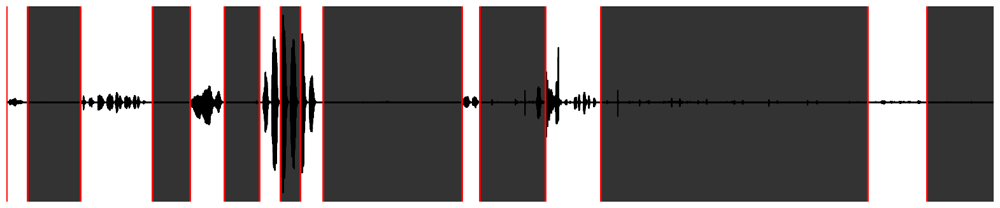

In [59]:
plot_and_play_wav('121103045057225251.WAV', 44100)

## Acoustics Properties

In [30]:
import librosa
from scipy.signal import butter, lfilter

from matplotlib import pyplot as plt

In [29]:
sr = 250000
n_fft = 2048
fmin = 256
fmax = 120000
n_mels = 64
hop_length = 256
win_length=1024


def butter_bandpass(lowcut=256, highcut=120000, fs=250000, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut=256, highcut=120000, fs=250000, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y


# filter signal

from scipy.signal import butter, sosfilt

def bandpass_filter(audio_data, low_freq=256, high_freq=120000, rate=250000, order=5):
    sos = butter(order, Wn = [low_freq, high_freq], btype='bandpass', fs=rate, output='sos')
    filtered_audio = sosfilt(sos, audio_data)
    return filtered_audio
    

def denoise(y, sr, ):
    """
    https://github.com/timsainb/noisereduce
    I tuned them check with files
    """

    y = nr.reduce_noise(y=y, sr=sr, 
                        time_constant_s= 0.2,
                        time_mask_smooth_ms = 5,
                        stationary = False,
                        freq_mask_smooth_hz = 256,
                        n_fft = n_fft,
                        hop_length = hop_length,
                        win_length = win_length,
                        n_jobs = 4
                        )
    
    return y

def preemphasise(y, pre_emphasis = 0.97):
    
    #  emphasized_signal
    y = np.append(y[0], y[1:] - pre_emphasis * y[:-1])
    
    return y

    


def get_wav_info(filename):
    #print('get_wav_info', filename)
    #wav_info = file_info[file_info['File name'] == filename]
    wav_info = file_info.set_index('File name').loc[filename]
    folder_loc = wav_info['File folder']
    wav_loc = DSLOC/'zip_contents'/ folder_loc / filename
    
    rate, data = load_wav(wav_loc)
    
    wav_info = wav_info.to_frame().T
    start_times = wav_info.loc[:, wav_info.columns.str.startswith('voice_start_')].dropna(axis=1).values[0]
    end_times = wav_info.loc[:, wav_info.columns.str.startswith('voice_end_')].dropna(axis=1).values[0]

    
    return rate, data, start_times, end_times


def get_segment_list(start_times, end_times):
    # duration all segments + intervals
    #l = list(zip(zip(start_times, end_times), zip(end_times,start_times[1:])))
    #segments = [item for sublist in l for item in sublist]
    
    # duration all segments (no intervals)
    segments = list(zip(start_times, end_times))
    durations = [end_time - start_time for start_time, end_time in segments]
    return segments, durations

def get_mfccs(y, sr, start_times, end_times):
    mfccs = []
    
    # duration
    segments, durations = get_segment_list(start_times, end_times)

    #for start, end in zip(start_times, end_times):
    for segment in segments:
        #start, end = int(start), int(end)
        start, end = int(segment[0]), int(segment[1])
        mfcc = librosa.feature.mfcc(y = y[start:end], sr=sr, n_fft = 1024, win_length=512, hop_length=256, n_mels=32, fmax=120000)
        mfccs.append(mfcc)

    return mfccs


def get_segments_audio(y, sr, start_times, end_times):
    voc_segments = []
    
    # duration
    segments, durations = get_segment_list(start_times, end_times)
    for segment in segments:
        start, end = int(segment[0]), int(segment[1])
        
        voc_segments.append(y[start:end])
        
    return voc_segments


def get_segments_ix(filename, start_times, end_times ):
    voc_segments_ix = []
    
    # folder_loc
    #wav_info = file_info[file_info['File name'] == filename]
    #folder_loc = wav_info['File folder']
    
    wav_info = file_info.set_index('File name').loc[filename]
    folder_loc = wav_info['File folder']
    
    
    segments, durations = get_segment_list(start_times, end_times)
    for i, segment in enumerate(segments):
        start, end = int(segment[0]), int(segment[1])
        
        voc_segments_ix.append((folder_loc, filename, i, start, end))
        
    return voc_segments_ix
        

def get_segment_spectrogram(y, sr, start_times, end_times):
    specs = []
    
    # duration
    segments, durations = get_segment_list(start_times, end_times)
    for segment in segments:
        start, end = int(segment[0]), int(segment[1])
        s = librosa.stft(y, n_fft = n_fft, win_length=win_length, hop_length=hop_length)
        specs.append( np.abs(s) )
    
    return specs
    
def dynamic_time_warping_by_mfcc(mfccs):
    # Calculate dynamic time warping distances
    #distances = pairwise_distances(mfccs, metric='euclidean')
    distances = []
    for x in mfccs:
        for y in mfccs:
            D, wp = librosa.sequence.dtw(x, y)
            distances.append(D[wp[-1, 0], wp[-1, 1]])
            
    return distances

def get_segment_classes(filename, start_times, end_times, label_list):
    
    segments, durations = get_segment_list(start_times, end_times)
    
    # FileID
    fileID = file_info[file_info['File name'] == filename].index[0]
    #fileID = file_info.reset_index().set_index('File name').loc['121215185639207203.WAV']['FileID']
    
    labels = annotations.set_index('FileID').loc[int(fileID)][[*label_list]].values
    labels = ' '.join(map(str,map(int, np.unique(labels))))
    
    return [labels for segment in segments]
        

def get_mel_filterbanks(y, sr, start_times, end_times):
    melfb = librosa.filters.mel(sr=sr, n_fft=n_fft, fmin=fmin, n_mels=n_mels)
    stft_spec  =  np.abs(librosa.stft(segment, n_fft=n_fft, hop_length=hop_length, win_length=win_length))
    return melfb.dot(stft_spec)
    

# Utils for testing

def plot_and_play_wav(filename, desired_rate = 44100):
    
    rate, data, start_times, end_times = get_wav_info(filename)
    
    fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(20,4))
    plt.plot(data, color='black')
    ax.set_xlim((0, len(data)))
    ax.axis('off')

    # not selected silence
    for st, et in zip(end_times[:-1], start_times[1:]):
        ax.axvspan(st, et, alpha=0.8, color='black')

    ax.axvspan(0, start_times[0], alpha=0.8, color='black')
    ax.axvspan(end_times[-1], len(data), alpha=0.8, color='black')

    # selected
    for st, et in zip(start_times, end_times):
        ax.axvline(x=st, color = 'red', lw=2)
        ax.axvline(x=et, color='red', lw=2)
    plt.show()

    display(Audio(data = data, rate = desired_rate))

#### Test

In [270]:
# test
wav_loc = DSLOC/'zip_contents'/ 'files102' / '120614013233718915.WAV'
wav_info = file_info[file_info['File name'] == '120614013233718915.WAV']

rate, data = load_wav(wav_loc)
print(rate, len(data))

start_times = wav_info.loc[:, wav_info.columns.str.startswith('voice_start_')].dropna(axis=1).values[0]
end_times = wav_info.loc[:, wav_info.columns.str.startswith('voice_end_')].dropna(axis=1).values[0]

assert(len(start_times) == len(end_times))

250000 861008


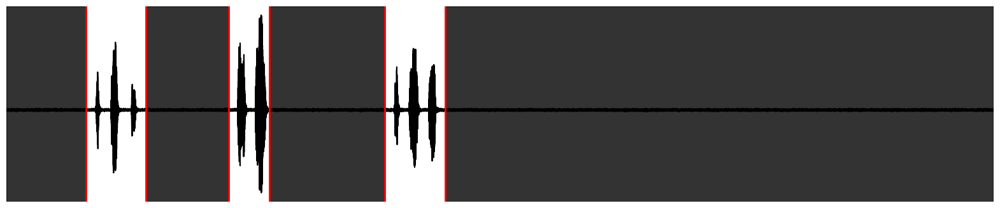

In [135]:
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(20,4))
plt.plot(data, color='black')
ax.set_xlim((0, len(data)))
ax.axis('off')

# not selected silence
for st, et in zip(end_times[:-1], start_times[1:]):
    ax.axvspan(st, et, alpha=0.8, color='black')
    
ax.axvspan(0, start_times[0], alpha=0.8, color='black')
ax.axvspan(end_times[-1], len(data), alpha=0.8, color='black')

# selected
for st, et in zip(start_times, end_times):
    ax.axvline(x=st, color = 'red', lw=2)
    ax.axvline(x=et, color='red', lw=2)
plt.show()

Audio(data = data, rate = 192000)

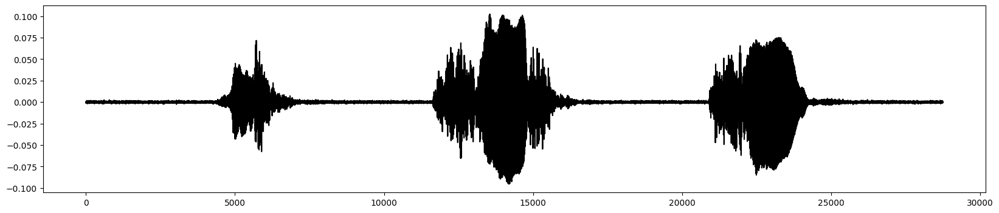

In [138]:
from IPython.display import Audio, HTML
# Plot a segment

i = 2
segment = data[ int(start_times[ i]) : int(end_times[i]) ]



fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(20,4))
plt.plot(segment, color='black')
#ax.axis('off')
plt.show()

Audio(data = segment, rate = 192000)

In [139]:
pre_emphasis  = 0.97
emphasized_signal = np.append(segment[0], segment[1:] - pre_emphasis * segment[:-1])

PROJECT_DIR set on:  /data0/home/h21/luas6629/Thesis
PROJECT_DIR set on:  /data0/home/h21/luas6629/Thesis
PROJECT_DIR set on:  /data0/home/h21/luas6629/Thesis
PROJECT_DIR set on:  /data0/home/h21/luas6629/Thesis


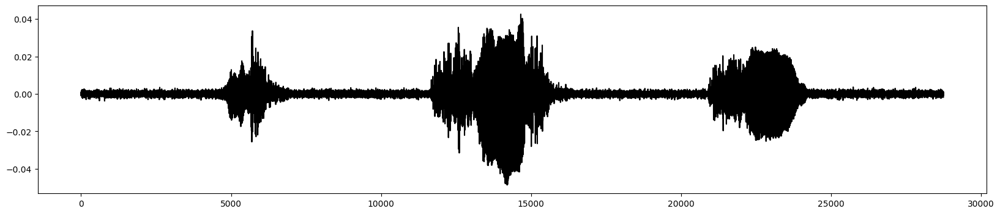

In [140]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(20,4))
plt.plot(emphasized_signal, color='black')
#ax.axis('off')
plt.show()

Audio(data = emphasized_signal, rate = 192000)

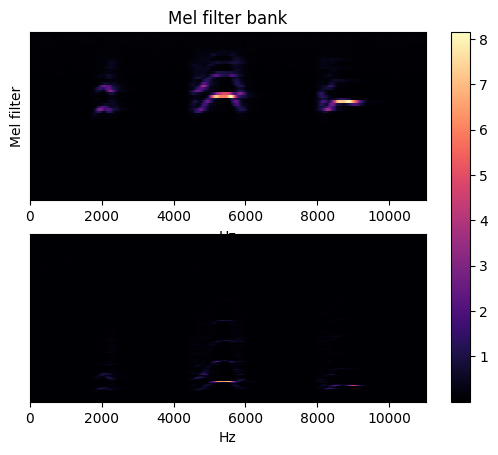

In [219]:
import matplotlib.pyplot as plt

melfb = librosa.filters.mel(sr=250000, n_fft=2048, fmin=256, n_mels=64)

stft_spec  =  np.abs(librosa.stft(emphasized_signal, n_fft=2048, hop_length=64, win_length=1024))

fig, ax = plt.subplots(nrows=2)

img = librosa.display.specshow(melfb.dot( stft_spec), x_axis='linear', ax=ax[0])

ax[0].set(ylabel='Mel filter', title='Mel filter bank')

img = librosa.display.specshow( stft_spec, x_axis='linear', ax=ax[1])

fig.colorbar(img, ax=ax)

In [22]:
melfb.shape

(64, 1025)

In [22]:
def stft(segment, n_fft, hop_length):
    # Compute the spectrogram using Short-Time Fourier Transform (STFT)

    stft = librosa.stft(y=segment, n_fft=n_fft, hop_length=hop_length)

    #using avgn
    #stft = _stft(segment, rate, bat_hparams)

    spec = np.abs(stft)
    return spec

In [23]:
def spectral_constrast(spectrogram, **kwargs):
    return librosa.feature.spectral_centroid(y=spectrogram, sr=250000, S=None, n_fft=2048, hop_length=512, freq=None, win_length=None, window='hann', center=True, pad_mode='constant')



In [220]:
# filter signal

from scipy.signal import butter, sosfilt

def bandpass_filter(audio_data, low_freq=440, high_freq=120000, rate=250000):
    sos = butter(4, Wn = [low_freq, high_freq], btype='bandpass', fs=rate, output='sos')
    filtered_audio = sosfilt(sos, audio_data)
    return filtered_audio
    

In [341]:
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt

# load the audio file
audio, sr = data, 250000

filtered_audio = bandpass_filter(audio)

y = audio

# noise reduction
import noisereduce as nr

#y = filtered_audio



y = nr.reduce_noise(y=y, sr=sr, 
                    time_constant_s= 0.2,
                    time_mask_smooth_ms = 5,
                    stationary = False,
                    freq_mask_smooth_hz = 256,
                    n_fft = n_fft,
                    hop_length = hop_length,
                    win_length = win_length,
                    n_jobs = 4
                    )


#  emphasized_signal
y = np.append(y[0], y[1:] - pre_emphasis * y[:-1])


# set the parameters for spectrogram and rolloff
n_fft = 2048
hop_length = 64
win_length = 1024
fmin = 220


In [332]:
import io
from scipy.io.wavfile import write as write_wav

bytes_wav = bytes()
wav_object = io.BytesIO(bytes_wav)
write_wav('test_wav_segment.wav', 250000, segment) # y is your numpy array


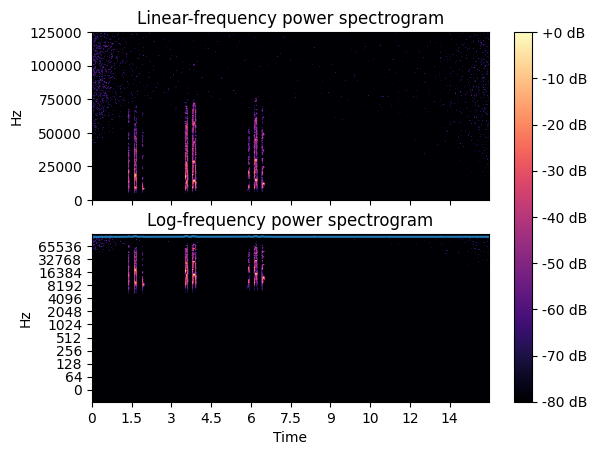

In [342]:
fig, ax = plt.subplots(nrows=2, ncols=1, sharex=True)




# Plot linear frequency

spec = np.abs(librosa.stft(y = y, 
                           n_fft=n_fft, 
                           hop_length=hop_length, 
                           win_length=win_length))

spec_m = librosa.feature.melspectrogram(y = y, 
                           n_fft=n_fft, 
                           hop_length=hop_length, 
                           win_length=win_length)

D = librosa.amplitude_to_db(spec, ref=np.max)

img = librosa.display.specshow(D, 
                               sr=sr, 
                               y_axis='linear', 
                               x_axis='time',
                               ax=ax[0])

ax[0].set(title='Linear-frequency power spectrogram')

ax[0].label_outer()

# Plot log-frequency power
D = librosa.amplitude_to_db(spec, ref=np.max)

librosa.display.specshow(D, 
                         sr=sr, 
                         y_axis='log', 
                         x_axis='time', 
                         ax=ax[1])

# Plot roll-off

max_rolloff = librosa.feature.spectral_rolloff(sr=sr, S=np.abs(D), n_fft=n_fft, hop_length=hop_length, win_length=win_length, window='hann', center=True, pad_mode='constant', freq=None, roll_percent=0.85)

times = librosa.times_like(max_rolloff, sr=sr)

ax[1].plot(times, max_rolloff[0])
ax[1].set(title='Log-frequency power spectrogram')

ax[1].label_outer()

fig.colorbar(img, ax=ax, format="%+2.f dB")

In [390]:
D.shape, max_rolloff[0].shape

((1025, 91), (91,))

In [69]:
Audio(data=filtered_audio, rate=88200)

In [129]:
sr = 250000
n_fft = 2048
hop_length=256
win_length = 1024
fmin = 220

# shared parameters
spec_params = dict(n_fft=n_fft, hop_length=hop_length, win_length=win_length)



#S, phase = librosa.magphase(librosa.stft(filtered_audio))
#S **=2

sftf_spec = librosa.stft(filtered_audio, **spec_params)

S = np.abs(sftf_spec)**2

rolloff = librosa.feature.spectral_rolloff(S=S, sr=sr, **spec_params, roll_percent=0.85)

amplitude_spec = librosa.amplitude_to_db(S, ref=np.max)

rolloff_min = librosa.feature.spectral_rolloff(S=S, sr=sr, **spec_params, roll_percent=0.15)

fig, ax = plt.subplots()

librosa.display.specshow(amplitude_spec,
                         sr=sr,
                         hop_length = hop_length,
                         y_axis='log', x_axis='time', ax=ax)

times = librosa.times_like(rolloff, sr=sr, hop_length= hop_length)
ax.plot(times, rolloff[0], label='Roll-off frequency (0.85)')

ax.plot(times, rolloff_min[0], color='w',label='Roll-off frequency (0.15)')
ax.plot(times, librosa.feature.spectral_centroid(S=S, sr= sr, **spec_params)[0,:])

ax.legend(loc='lower right')

ax.set(title='log Power spectrogram')

NameError: name 'filtered_audio' is not defined

In [59]:
y, sr = librosa.load(librosa.ex('nutcracker'), duration=15)
Audio(data=y, rate=sr)

In [72]:
pandas.DataFrame({
        'upper': librosa.feature.spectral_rolloff(S=S, sr=sr, **spec_params, roll_percent=0.85)[0, :],
        'lower': librosa.feature.spectral_rolloff(S=S, sr=sr, **spec_params, roll_percent=0.15)[0, :],
        'spec_centroids' : librosa.feature.spectral_centroid(S=S, sr=sr, **spec_params)[0,:]
    }).describe()

,upper,lower,spec_centroids
count,91.000000,91.000000,91.000000
mean,19072.480254,9453.071343,14308.109487
std,11487.189582,1733.914990,5050.469703
min,12573.242188,6713.867188,10011.894065
25%,16967.773438,7995.605469,11885.544058
50%,17944.335938,9521.484375,14246.366697
75%,18676.757812,10437.011719,15503.034427
max,103393.554688,14648.437500,53996.614434


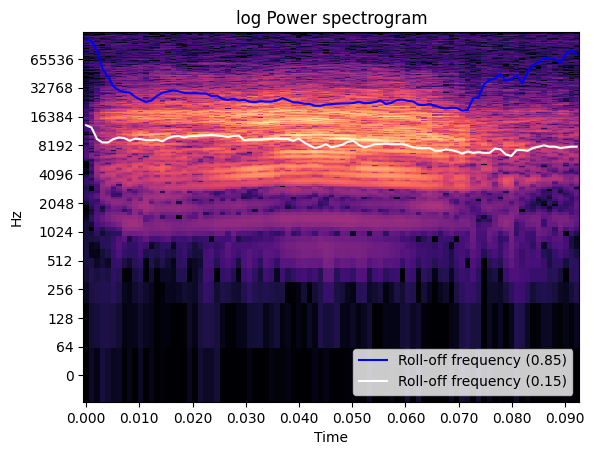

In [46]:
import librosa
import numpy as np
import pandas

from matplotlib import pyplot as plt
import librosa.display



def plot_spectral(audio, sr, hop_length=256, win_length=1024, n_fft=2048):

    # shared parameters
    spec_params = dict(n_fft=n_fft, hop_length=hop_length, win_length=win_length)

    # compute
    sftf_spec = librosa.stft(audio, **spec_params)
    S = np.abs(sftf_spec)
    amplitude_spec = librosa.amplitude_to_db(S, ref=np.max)

    up = librosa.feature.spectral_rolloff(S=S, sr=sr, **spec_params, roll_percent=0.85)
    
    rolloff = pandas.DataFrame({
        'upper': librosa.feature.spectral_rolloff(S=S, sr=sr, **spec_params, roll_percent=0.85)[0, :],
        'lower': librosa.feature.spectral_rolloff(S=S, sr=sr, **spec_params, roll_percent=0.15)[0, :],
    })
    rolloff['time'] = librosa.times_like(rolloff['lower'], sr=sr, hop_length=hop_length)

    fig, ax = plt.subplots()

    librosa.display.specshow(amplitude_spec, sr=sr, **spec_params,
                             y_axis='log', x_axis='time', ax=ax, )

    ax.plot(rolloff['time'], rolloff['upper'], color='blue', label='Roll-off frequency (0.85)')

    ax.plot(rolloff['time'], rolloff['lower'], color='white', label='Roll-off frequency (0.15)')

    ax.legend(loc='lower right')

    ax.set(title='log Power spectrogram')

    fig.savefig('spectral-rolloffs.png')


def load_data():
    p = 'test_wav_segment.wav'
    audio, sr = librosa.load(p, sr=None)
    return audio, sr

audio, sr = load_data()


plot_spectral(filtered_audio, sr=sr)

In [351]:
times.shape

(91,)

In [327]:
D

array([[-80.        , -79.59763072, -76.05107243, ..., -80.        ,
        -79.6039218 , -75.20384598],
       [-79.5161016 , -76.22698195, -74.13197216, ..., -75.34492621,
        -73.36635581, -72.33597412],
       [-74.59007295, -72.82007274, -71.49759249, ..., -69.44166033,
        -69.05351578, -69.38771918],
       ...,
       [-80.        , -80.        , -80.        , ..., -80.        ,
        -80.        , -80.        ],
       [-80.        , -80.        , -80.        , ..., -80.        ,
        -80.        , -80.        ],
       [-80.        , -80.        , -80.        , ..., -80.        ,
        -80.        , -80.        ]])

In [307]:
x = librosa.feature.melspectrogram(y=x, sr=250000, n_mels=64, fmax=120000)
y = librosa.feature.melspectrogram(y=y, sr=250000, n_mels=64, fmax=120000)
z = librosa.feature.melspectrogram(y=z, sr=250000, n_mels=64, fmax=120000)#

NameError: name 'x' is not defined

In [ ]:
512/250000*1000

In [ ]:
D, wp = librosa.sequence.dtw(x, x)

NameError: name 'D' is not defined

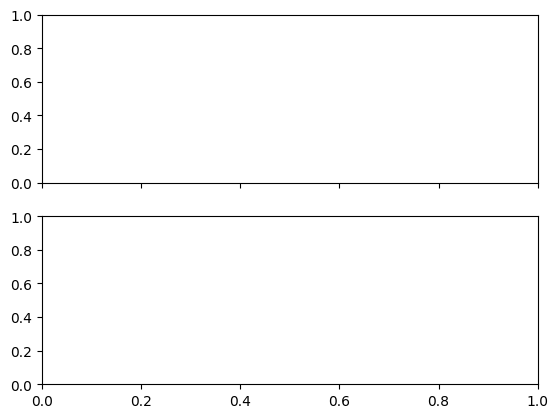

In [13]:
fig, ax = plt.subplots(nrows=2, sharex=True)

img = librosa.display.specshow(D, x_axis='frames', y_axis='frames',

                               ax=ax[0])

ax[0].set(title='DTW cost', xlabel='Noisy sequence', ylabel='Target')

ax[0].plot(wp[:, 1], wp[:, 0], label='Optimal path', color='y')

ax[0].legend()

fig.colorbar(img, ax=ax[0])

ax[1].plot(D[-1, :] / wp.shape[0])

ax[1].set(xlim=[0, x.shape[1]], 

          title='Matching cost function')

#### Single call similiarity between syllables (MFCC)

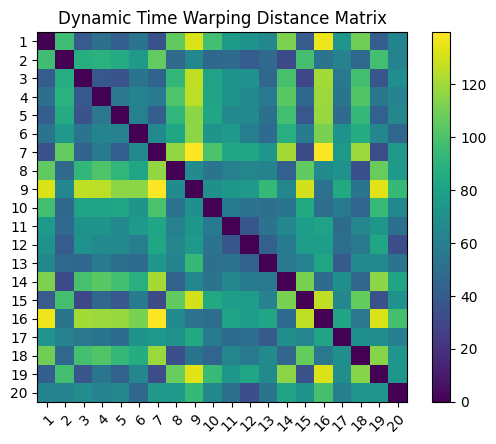

In [26]:
import librosa
from sklearn.metrics.pairwise import pairwise_distances
from scipy.special import softmax


# Load audio file
#audio_file = "example_audio.wav"
#y, sr = librosa.load(audio_file)
y = data
sr = 250000

# Define segment length and hop size
seg_len = 3  # segment length in seconds
hop_size = 1  # hop size in seconds

# Extract MFCCs for each segment
mfccs = []

l = list(zip(zip(start_times, end_times), zip(end_times,start_times[1:])))
segments = [item for sublist in l for item in sublist]

#for start, end in zip(start_times, end_times):
for segment in segments:
    #start, end = int(start), int(end)
    start, end = int(segment[0]), int(segment[1])
    mfcc = librosa.feature.mfcc(y = y[start:end], sr=sr, n_fft = 4096, win_length=1024, hop_length=256, n_mels=64, fmax=120000)
    mfccs.append(mfcc)


# Calculate dynamic time warping distances
#distances = pairwise_distances(mfccs, metric='euclidean')
distances = []
for x in mfccs:
    for y in mfccs:
        D, wp = librosa.sequence.dtw(x, y)
        distances.append(D[wp[-1, 0], wp[-1, 1]])

# normalize
distances = np.array(distances)
distances_norm = (distances-np.min(distances))/(np.max(distances)-np.min(distances))
        
# corr_matrix
n = int(np.sqrt(len(distances)))
distances = distances.reshape(n,n)

#distances = softmax(distances)

# Plot correlation matrix
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots()
im = ax.imshow(distances)

# Set axis labels and ticks
ax.set_xticks(np.arange(len(mfccs)))
ax.set_yticks(np.arange(len(mfccs)))
ax.set_xticklabels(np.arange(1, len(mfccs)+1))
ax.set_yticklabels(np.arange(1, len(mfccs)+1))

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# Set colorbar
cbar = ax.figure.colorbar(im, ax=ax)

# Show plot
plt.title('Dynamic Time Warping Distance Matrix')
plt.show()

In [27]:
from sklearn.preprocessing import normalize

#normalize matrix by columns
#distances_normed = normalize(distances, axis=1, norm='l1')
distances_normed = np.linalg.norm(distances, axis = 0, keepdims=True)
distances_normed[0];

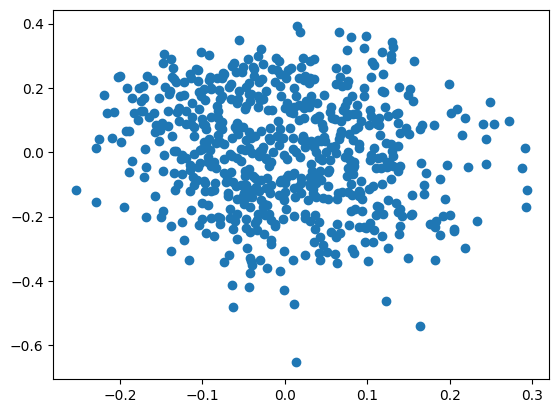

In [15]:
import numpy as np
from sklearn.manifold import MDS
import matplotlib.pyplot as plt

# Use MDS to find a 2D representation of the distances
mds = MDS(n_components=2, dissimilarity='precomputed',  normalized_stress='auto')
pos = mds.fit_transform(distances)

# Plot the points in 2D
plt.scatter(pos[:, 0], pos[:, 1])
plt.show()

In [29]:
# Determine the length of the longest MFCC
max_len = max(len(mfcc[0]) for mfcc in mfccs)

# Initialize array for padded/truncated MFCCs
mfccs_fixed = np.zeros((len(mfccs), 20, max_len))

# Pad or truncate MFCCs to fixed length
for i, mfcc in enumerate(mfccs):
    if mfcc.shape[1] < max_len:
        # Pad MFCC with zeros
        mfccs_fixed[i, :, :mfcc.shape[1]] = mfcc
    #else:
    #    # Truncate MFCC
    #    mfccs_fixed[i, :, :] = mfcc[:, :max_len]

In [30]:
import umap
import umap.plot
from sklearn.cluster import KMeans

# Convert mfccs to a 2D array
mfccs_flat = [mfcc.flatten() for mfcc in mfccs_fixed]

# Dimensionality reduction with UMAP
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42, metric='euclidean')

# embedding
embedding = reducer.fit_transform(mfccs_flat)

2023-03-28 10:09:03.111893: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-28 10:09:03.985172: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-03-28 10:09:03.985263: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory
2023-03-28 10:09:03.985273: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nv

In [31]:
#mapper = reducer.fit(mfccs_flat);
#umap.plot.points(mapper);

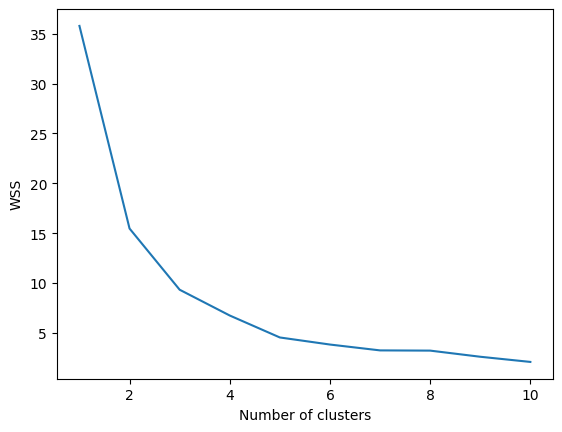

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin_min

# Compute WSS for different values of k
wss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto').fit(embedding)
    wss.append(kmeans.inertia_)

# Plot WSS vs. number of clusters
plt.plot(range(1, 11), wss)
plt.xlabel('Number of clusters')
plt.ylabel('WSS')
plt.show()

In [33]:
# Clusterization with K-means
kmeans = KMeans(n_clusters=3, random_state=0, n_init ='auto').fit(embedding)

# Count number of clusters
num_clusters = len(set(kmeans.labels_))

print("Number of clusters:", num_clusters)

Number of clusters: 3


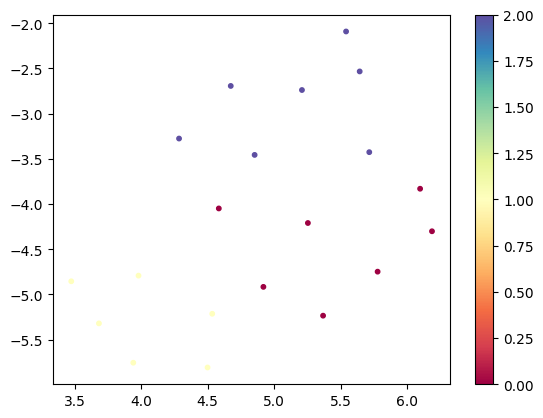

In [34]:
import matplotlib.pyplot as plt

# Plot UMAP embeddings
plt.scatter(embedding[:, 0], embedding[:, 1], c=kmeans.labels_, cmap='Spectral', s=10)
plt.colorbar()
plt.show()

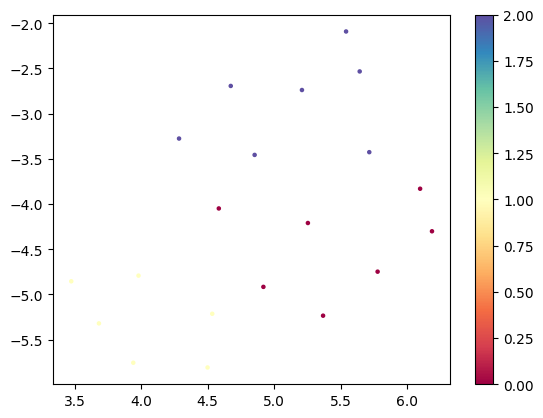

In [35]:
# Plot UMAP embeddings
plt.scatter(embedding[:, 0], embedding[:, 1], c=kmeans.labels_, cmap='Spectral', s=5)
plt.colorbar()
plt.show()

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from scipy.cluster.hierarchy import dendrogram, linkage


In [38]:
dbscan = DBSCAN(eps=.5, min_samples=2).fit(embedding)

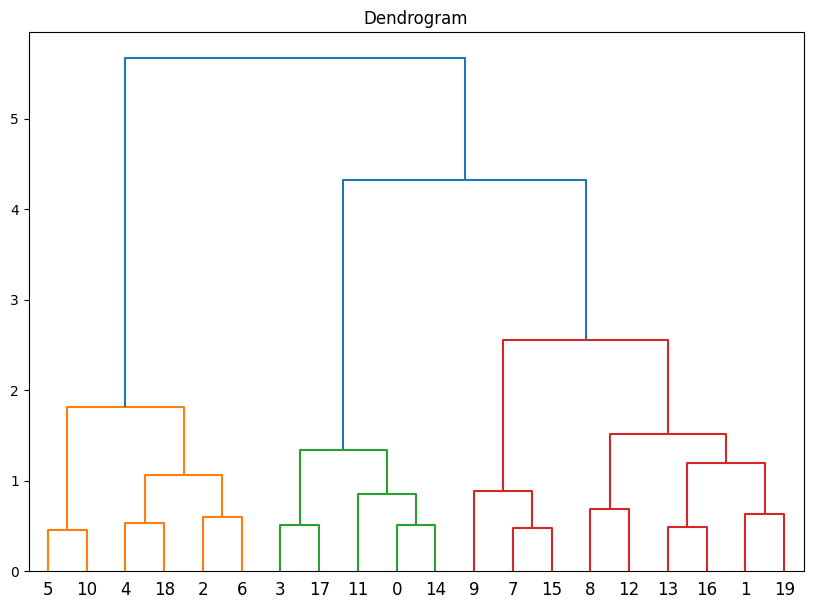

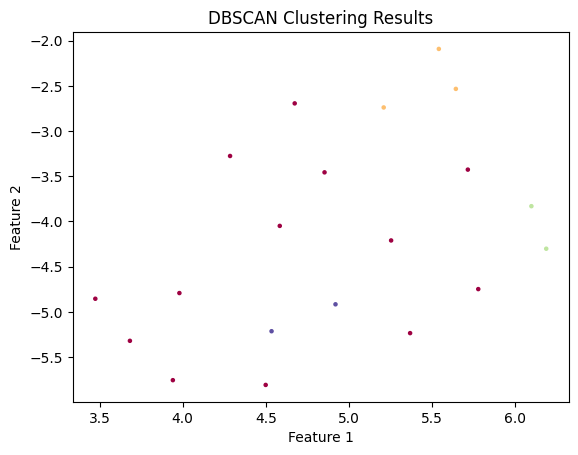

In [121]:
# Create dendrogram using hierarchical clustering
Z = linkage(embedding, method='ward')
plt.figure(figsize=(10, 7))
plt.title("Dendrogram")
dendrogram(Z)
plt.show()

# Plot DBSCAN results
plt.scatter(embedding[:, 0], embedding[:, 1], c=dbscan.labels_, cmap='Spectral', s=5)
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.title("DBSCAN Clustering Results")
plt.show()

In [40]:
i, k = 8, 15
Audio(data = data[int(segments[i][0]):int(segments[i][1])], rate = 88200)

In [41]:
Audio(data = data[int(segments[k][0]):int(segments[k][1])], rate = 88200)

## Feature Extraction in all calls (MFCC)

In [15]:
sample_files = get_sample_files(q.set_index('Emitter').loc[215])
sample_files

,FileID,TreatmentID,File name,File folder,Recording channel,Recording time,voice_start_sample_1,voice_end_sample_1,voice_start_sample_2,voice_end_sample_2,...,voice_start_sample_159,voice_end_sample_159,voice_start_sample_160,voice_end_sample_160,voice_start_sample_161,voice_end_sample_161,voice_start_sample_162,voice_end_sample_162,voice_start_sample_163,voice_end_sample_163
0,61822,13,121004165931143478.WAV,files201,9,2012-10-04 16:59:31,35795.0,71747.0,210795.0,242041.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,61879,13,121004172433181482.WAV,files201,9,2012-10-04 17:24:33,45141.0,74887.0,166141.0,195075.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,61882,13,121004172647137483.WAV,files201,9,2012-10-04 17:26:47,34295.0,62041.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,61894,13,121004172921179484.WAV,files201,9,2012-10-04 17:29:21,44829.0,79575.0,109329.0,144075.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,61900,13,121004173710156486.WAV,files201,9,2012-10-04 17:37:10,39101.0,61041.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,145582,13,121215185639207203.WAV,files210,10,2012-12-15 18:56:39,51714.0,66283.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59,145811,13,121215194801160266.WAV,files210,10,2012-12-15 19:48:01,40086.0,69887.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
60,146168,13,121215215551163487.WAV,files210,10,2012-12-15 21:55:51,40717.0,74644.0,86768.0,110871.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61,146521,13,121216011705137685.WAV,files210,10,2012-12-16 01:17:05,34179.0,62407.0,78175.0,106411.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
file_info.loc[sample_filesIDs]

NameError: name 'sample_filesIDs' is not defined

In [13]:
def get_label_classes(sample_files, Category):
    """
    Associate a label Class to each segment
    """
    classes = []

    if file_info.index.name != 'FileID':
        file_info.set_index('FileID', inplace=True) 

    sample_filesIDs = sample_files['FileID'].to_list()
    filenames = file_info.loc[sample_filesIDs]['File name'].values

    for name in filenames:
        #print(name)
        rate, data, start_times, end_times = get_wav_info(name)    

        classes.extend( get_segment_classes(name, start_times, end_times, [Category] ))
    
    return classes
    
#labels_Addressee = get_label_classes(sample_files, 'Addressee')

In [14]:
%%time

def compute_segments_props(sample_files):
    """
    Compute the props for each segments of files in the sample
    """

    # labels
    labels = {'label_addressee' : get_label_classes(sample_files, 'Addressee'),
              'label_context' : get_label_classes(sample_files, 'Context')
             }
    
    # segments_audio
    voc_segments = []

    # segments_indexes
    voc_segments_ix = []

    #duration segments
    duration_segments = []

    # total_mfccs
    mfccs = []

    # total mel_filtered
    mel_filtered = []

    # spectrograms
    specs = []

    if file_info.index.name != 'FileID':
        file_info.set_index('FileID', inplace=True) 
    
    sample_filesIDs = sample_files['FileID'].to_list()
    filenames = file_info.loc[sample_filesIDs]['File name'].values
    
    for name in filenames:
        #print('Filename', name)
        rate, data, start_times, end_times = get_wav_info(name)    

        #y_filtered = butter_bandpass_filter(data)
        #y_filtered = data
        
        y_filtered = denoise(data, rate)
        y_filtered = preemphasise(y_filtered)
        
        voc_segments.extend(get_segments_audio(y_filtered, rate, start_times, end_times))
        voc_segments_ix.extend(get_segments_ix(name, start_times, end_times))
        
        mfccs.extend(get_mfccs(y_filtered, rate, start_times, end_times))

        # too computational expensive?
        #mel_filtered.extend(get_mel_filterbanks(y_filtered, sr, start_times, end_times))

        segments, durations = get_segment_list(start_times, end_times)
        duration_segments.extend(durations)
        
        specs.extend(get_segment_spectrogram(data, rate, start_times, end_times))

    
    props  = {
        
        # segments_audio
        'voc_segments' : voc_segments,

        # segments_indexes
        'voc_segments_ix' : voc_segments_ix,

        #duration segments
        'duration_segments' : duration_segments,

        # total_mfccs
        'mfccs' : mfccs,

        # total mel_filtered
        'mel_filtered' : mel_filtered,

        # spectrograms
        'specs' : specs,

        #labels
        'labels' : labels
    
    }
    
    
    
    return props
        

    
# test
props = compute_segments_props(sample_files[:10])

CPU times: user 14.7 s, sys: 30.2 s, total: 45 s
Wall time: 14.1 s


In [ ]:
%%time

# compute the segments specs and props
n_jobs = 32

for Emitter in q.set_index('Emitter').index.unique():

    sample_files = get_sample_files(q.set_index('Emitter').loc[Emitter])

    with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
        props = parallel(
            delayed(compute_segments_props)(
                sample_files.loc[ix].to_frame().T
                #chunk
            )
            for ix in tqdm(range(len(sample_files)))
            #for chunk in tqdm(np.array_split(sample_files, 2))
        )

    with open(f'pup_to_mother_emitter_{Emitter}.pkl','wb') as f:
        pickle.dump(props, f, protocol=pickle.HIGHEST_PROTOCOL)

## Unsupervised clustering and labelling of syllables

In [31]:
from pandas import json_normalize
import pickle

def import_segments_df(Emitter):
    with open(f'pup_to_mother_emitter_{Emitter}.pkl','rb') as f:
        df = pickle.load(f)

    df = pd.DataFrame.from_dict(json_normalize(df)).apply(pd.Series.explode).reset_index()
    df.rename(columns={"index": "commonSourceID"}, inplace=True)
    df.drop_duplicates(subset=["voc_segments_ix"], keep="first", inplace=True)
    df.reset_index(drop=True, inplace=True)
    df.index.set_names('segmentID', inplace=True)
    df['Emitter'] = Emitter
    return df

def import_segments_df_All(new=False):
    #120, 111, 215, 231, 214, 202, 216, 222, 220, 208, 221, 211, 230, 210
    def make_db():
        df = pd.concat([import_segments_df(Emitter) for Emitter in [207, 120, 111, 215, 231, 214, 202, 216, 222, 220, 208, 221, 211, 230, 210]])
        df.drop_duplicates(subset=["voc_segments_ix"], keep="first", inplace=True)
        df.reset_index(drop=True, inplace=True)
        df.index.set_names('segmentID', inplace=True)
        return df

    def load_db():
        with open(f'pup_to_mother_emitter_All.pkl','rb') as f:
            df = pickle.load(f)
            df.reset_index(drop=True, inplace=True)
            df.index.set_names('segmentID', inplace=True)
            return df 
    
    def save_db(df):
        with open(f'pup_to_mother_emitter_All.pkl','wb') as f:
            pickle.dump(df, f, protocol=pickle.HIGHEST_PROTOCOL)
            print('pup_to_mother_emitter_All.pkl is saved on disk')
    
    if (new):
        df = make_db()
        save_db(df)
        return df
    else:
        try:
            return load_db()
        except FileNotFoundError:
            print('Db not existing. Creating db')
            df = make_db()
            save_db(df)
            return df

In [32]:
%%time
pup2mother_All = import_segments_df_All()

CPU times: user 222 ms, sys: 26.8 s, total: 27 s
Wall time: 31 s


In [89]:
pup2mother_All.reset_index(drop=True, inplace=True)
pup2mother_All.index.set_names('segmentID', inplace=True)

In [33]:
pup2mother_All.tail()

,commonSourceID,voc_segments,voc_segments_ix,duration_segments,mfccs,mel_filtered,specs,labels.label_addressee,labels.label_context,Emitter
segmentID,,,,,,,,,,
46,37,"[-2.6095164e-05, -8.122064e-06, 2.9972187e-05,...","(files210, 121217231303167058.WAV, 0, 41670, 8...",46909.0,"[[-545.08887, -525.39185, -515.76306, -515.358...",NaN,"[[0.0035819786, 0.009230218, 0.012670663, 0.01...",232,6,230
47,38,"[-2.6739226e-06, 5.417502e-06, -1.45972235e-05...","(files210, 121217234551133060.WAV, 0, 33141, 8...",51753.0,"[[-561.4513, -559.8718, -560.2934, -560.8998, ...",NaN,"[[0.0029338412, 0.005306011, 0.004094286, 0.00...",232,6,230
0,0,"[1.4897312e-05, -4.8678376e-06, 5.073974e-06, ...","(files209, 121209230635150780.WAV, 0, 37437, 9...",61046.0,"[[-561.66754, -559.31836, -557.9643, -557.7261...",NaN,"[[0.005965381, 0.008655659, 0.0078096, 0.00805...",212,6,210
1,1,"[2.3074608e-07, -1.3741694e-05, -1.1886405e-06...","(files209, 121210210333207977.WAV, 0, 51744, 9...",48196.0,"[[-542.8195, -534.5935, -536.5836, -547.09174,...",NaN,"[[0.0058841826, 0.010755239, 0.011369345, 0.00...",212,6,210
2,2,"[2.1382024e-05, -7.755294e-06, 1.4935663e-05, ...","(files209, 121211022010135151.WAV, 0, 33641, 7...",43748.0,"[[-560.4033, -557.34595, -557.7388, -555.9712,...",NaN,"[[0.0064194025, 0.010328131, 0.010762211, 0.01...",212,6,210


In [34]:
# Compute distances 

# This is: fast
# https://github.com/wannesm/dtaidistance

from dtaidistance import dtw

def compute_dtw(series):
    return dtw.distance_matrix_fast(series)

def plot_dtw_matrix(ds):
    
    ds = (ds-np.min(ds))/(np.max(ds)-np.min(ds))
    
    
    fig, ax = plt.subplots()
    im = ax.imshow(ds)

    n_labels = ds.shape[0]
    
    # Set axis labels and ticks
    #ax.set_xticks(np.arange(n_labels))
    #ax.set_yticks(np.arange(n_labels))
    #ax.set_xticklabels(np.arange(1, n_labels+1))
    #ax.set_yticklabels(np.arange(1, n_labels+1))

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=0, ha="right", rotation_mode="anchor")

    # Set colorbar
    cbar = ax.figure.colorbar(im, ax=ax)

    # Show plot
    plt.title('Dynamic Time Warping Distance Matrix')
    plt.show()

In [35]:
# Hierarchical Clustering


from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.spatial.distance import squareform

def get_dendrogram(ds):
    
    # norm if not..
    ds = (ds-np.min(ds))/(np.max(ds)-np.min(ds))
    
    # sparse matrix 
    condensed_dist = squareform(ds)
    
    # Create dendrogram using hierarchical clustering
    Z = linkage(condensed_dist, method='ward')
    
    return Z


def plot_dendrogram(Z, threshold=None):

    
    fig, ax = plt.subplots(figsize=(10, 7))
    ax.set_title("Dendrogram")

    # Plot the dendrogram
    dendrogram(Z, labels=None, ax = ax)

    if threshold:
        ax.axhline(y=elbow_point[0], color='r', linestyle='--')
        ax.set_title(f"Dendrogram - Threshold: {elbow_point[0]} (normalized DTW)")

    plt.show()

In [36]:
import numpy as np
from kneed import KneeLocator


def get_threshold(Z, shift_right_steps=0):
    
    # Shift time on the right to ensure shape is convex decreasing curve 
    t_step = np.arange(0, 1, .01)[shift_right_steps:]
    c_size = [ len(np.unique(fcluster(Z, t, criterion='distance'))) for t in t_step]

    # Find the elbow point using the KneeLocator function from the kneed library
    kn = KneeLocator(t_step, c_size, curve='convex', direction='decreasing')

    elbow_point = (kn.knee, kn.knee_y)

    # plot the point
    fig, ax = plt.subplots()
    ax.plot(t_step, c_size)
    ax.axvline(x=elbow_point[0], color='r', linestyle='--')
    ax.set_xlabel('Threshold')
    ax.set_ylabel('Number of clusters')
    ax.set_title('Elbow plot')
    plt.show()

    print("Elbow point: ", elbow_point)
    
    return elbow_point

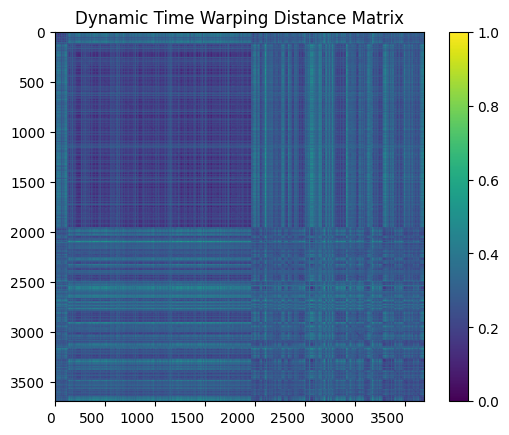

CPU times: user 18.4 s, sys: 357 ms, total: 18.8 s
Wall time: 2.4 s


In [37]:
%%time
ds = compute_dtw(pup2mother_All['mfccs'].to_list())
plot_dtw_matrix(ds)

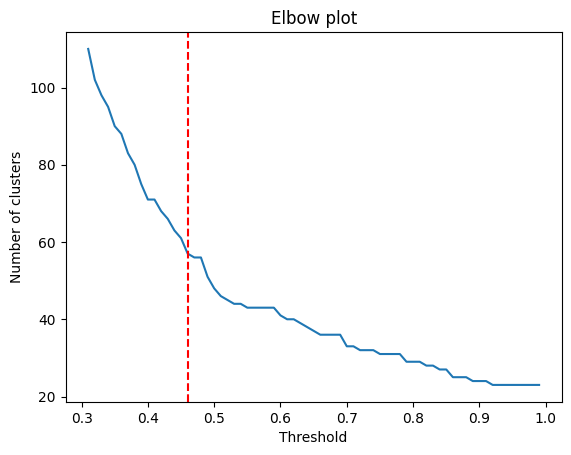

Elbow point:  (0.46, 57)


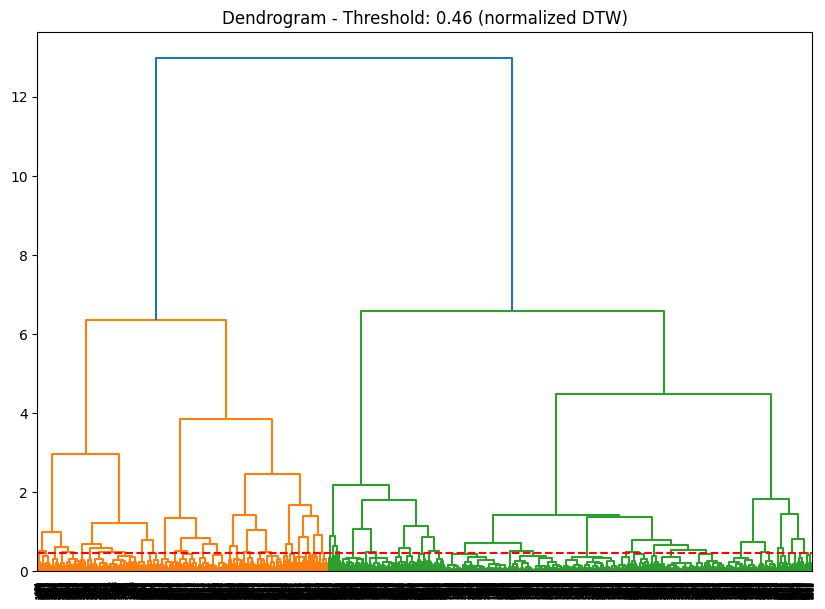

In [38]:
Z = get_dendrogram(ds)
elbow_point = get_threshold(Z, shift_right_steps = 31)
plot_dendrogram(Z, elbow_point)

## Vocabulary of Syllables

In [39]:
def get_clusters(Z, threshold, criterion = 'distance'):
    clusters_dendrogram = fcluster(Z, threshold, criterion=criterion)
    return clusters_dendrogram

def plot_clusters_frequences(clusters_list):
    """
    A list with a numerical ID associated to the Index of each segment
    """
    bars, freq = np.unique(clusters_list, return_counts=True)
    
    plt.bar(bars, freq)
    plt.title('Number of segments per cluster')
    plt.show()

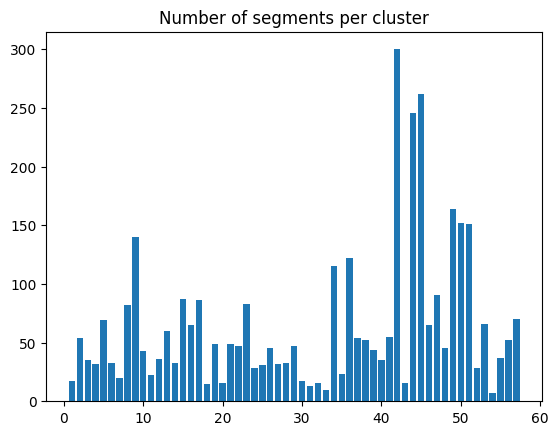

In [42]:
clusters_dendrogram = get_clusters(Z, 0.46, criterion = 'distance')

plot_clusters_frequences(clusters_dendrogram)

In [43]:
from IPython.display import HTML


def voc_syllables(df, clusters):
    
    """
    Input: clusters is a list of clusterIDs.  len(clusters) == df.shape[0]
    Return 2 vocabularies:  voc_syllables_clusters, voc_syllables_clusters_ix
    
    voc_syllables_clusters:  voc of numpy audios
    voc_syllables_clusters_ix: voc of their Index in the DataFrame
    """
    
    voc_syllables_clusters = dict()
    voc_syllables_clusters_ix = dict()
    
    # ix is the position of cluster, corresponding to the ix of syllables in the df
    for ix, row in df.iterrows():
        
        # segment
        sID = row['segmentID']
        s = row['voc_segments']
        file_location_ix = row['voc_segments_ix']
    
        # cluster
        c = clusters[sID]
        
        if c in voc_syllables_clusters:
            voc_syllables_clusters[c].append(s)
            voc_syllables_clusters_ix[c].append(file_location_ix)
        else:
            voc_syllables_clusters[c] = [s]
            voc_syllables_clusters_ix[c] = [file_location_ix]     
        
    return voc_syllables_clusters, voc_syllables_clusters_ix

In [109]:
for ix, row in pup2mother_All.iterrows():
    print(row['voc_segments'])
    break

[ 6.4468753e-05  4.4896227e-05 -1.1276439e-04 ...  4.0007602e-05
 -3.1378338e-05  1.4919778e-05]


In [120]:
pup2mother_All.tail()

,segmentID,commonSourceID,voc_segments,voc_segments_ix,duration_segments,mfccs,mel_filtered,specs,labels.label_addressee,labels.label_context,Emitter
3692,3692,37,"[-2.6095164e-05, -8.122064e-06, 2.9972187e-05,...","(files210, 121217231303167058.WAV, 0, 41670, 8...",46909.0,"[[-545.08887, -525.39185, -515.76306, -515.358...",NaN,"[[0.0035819786, 0.009230218, 0.012670663, 0.01...",232,6,230
3693,3693,38,"[-2.6739226e-06, 5.417502e-06, -1.45972235e-05...","(files210, 121217234551133060.WAV, 0, 33141, 8...",51753.0,"[[-561.4513, -559.8718, -560.2934, -560.8998, ...",NaN,"[[0.0029338412, 0.005306011, 0.004094286, 0.00...",232,6,230
3694,3694,0,"[1.4897312e-05, -4.8678376e-06, 5.073974e-06, ...","(files209, 121209230635150780.WAV, 0, 37437, 9...",61046.0,"[[-561.66754, -559.31836, -557.9643, -557.7261...",NaN,"[[0.005965381, 0.008655659, 0.0078096, 0.00805...",212,6,210
3695,3695,1,"[2.3074608e-07, -1.3741694e-05, -1.1886405e-06...","(files209, 121210210333207977.WAV, 0, 51744, 9...",48196.0,"[[-542.8195, -534.5935, -536.5836, -547.09174,...",NaN,"[[0.0058841826, 0.010755239, 0.011369345, 0.00...",212,6,210
3696,3696,2,"[2.1382024e-05, -7.755294e-06, 1.4935663e-05, ...","(files209, 121211022010135151.WAV, 0, 33641, 7...",43748.0,"[[-560.4033, -557.34595, -557.7388, -555.9712,...",NaN,"[[0.0064194025, 0.010328131, 0.010762211, 0.01...",212,6,210


In [137]:
voc_syllables_clusters, voc_syllables_clusters_ix = voc_syllables(pup2mother_All, clusters_dendrogram);

#c = 1
#[display(Audio(data = s, rate = 88200), HTML(f'{voc_syllables_clusters_ix[c][i]}')) for i, s in enumerate(voc_syllables_clusters[c])] 
   

In [91]:
np.unique(clusters_dendrogram)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47], dtype=int32)

In [ ]:
columns = ("Length Distance sig1Max sig2Max" 
           "sig3Max sig1Min sig2Min sig3Min").split()

In [93]:
pup2mother_All[pup2mother_All['voc_segments_ix'] == ('files202', '121005221219635013.WAV', 2, 168273, 207519)

]

,commonSourceID,voc_segments,voc_segments_ix,duration_segments,mfccs,mel_filtered,specs,labels.label_addressee,labels.label_context,Emitter
segmentID,,,,,,,,,,
9,3,"[8.698359e-06, -1.1321612e-05, 1.0857835e-05, ...","(files202, 121005221219635013.WAV, 2, 168273, ...",39246.0,"[[-562.65533, -561.8869, -560.9063, -560.8508,...",NaN,"[[0.004343775, 0.008450921, 0.010023861, 0.008...",209,6,207


In [155]:

def voc_syllables(df, clusters):
    
    """
    Input: clusters is a list of clusterIDs.  len(clusters) == df.shape[0]
    Return 2 vocabularies:  voc_syllables_clusters, voc_syllables_clusters_ix
    
    voc_syllables_clusters:  voc of numpy audios
    voc_syllables_clusters_ix: voc of their Index in the DataFrame
    """
    
    voc_syllables_clusters = dict()
    voc_syllables_clusters_ix = dict()
    
    # ix is the position of cluster, corresponding to the ix of syllables in the df
    for ix, row in df.iterrows():
        
        # segment
        sID = row['segmentID']
        s = row['voc_segments']
        file_location_ix = row['voc_segments_ix']
    
        # cluster
        c = clusters[sID]
        
        if c in voc_syllables_clusters:
            voc_syllables_clusters[c].append(s)
            voc_syllables_clusters_ix[c].append(file_location_ix)
        else:
            voc_syllables_clusters[c] = [s]
            voc_syllables_clusters_ix[c] = [file_location_ix]     
        
    return voc_syllables_clusters, voc_syllables_clusters_ix


    

,segmentID,voc_segments,Folder,File name,sequenceID,start,end
0,0,"[6.446875e-05, 4.4896227e-05, -0.00011276439, ...",files201,121002212651151905.WAV,0,37678,66019
1,1,"[-2.3025896e-06, -7.829122e-06, 8.1741e-06, -2...",files201,121002212651151905.WAV,1,105273,124646
2,2,"[-2.8932895e-06, -5.47872e-06, 1.1616736e-05, ...",files201,121002212651151905.WAV,2,179273,208019
3,3,"[-3.794899e-06, -1.6078811e-05, 2.2058917e-05,...",files201,121003075445185924.WAV,0,46237,72983
4,4,"[-1.5913945e-05, -3.0341653e-08, 2.945746e-05,...",files201,121004173718193940.WAV,0,48342,75115
...,...,...,...,...,...,...,...
3692,3692,"[-2.6095164e-05, -8.122064e-06, 2.9972187e-05,...",files210,121217231303167058.WAV,0,41670,88579
3693,3693,"[-2.6739226e-06, 5.417502e-06, -1.45972235e-05...",files210,121217234551133060.WAV,0,33141,84894
3694,3694,"[1.4897312e-05, -4.8678376e-06, 5.073974e-06, ...",files209,121209230635150780.WAV,0,37437,98483
3695,3695,"[2.3074608e-07, -1.3741694e-05, -1.1886405e-06...",files209,121210210333207977.WAV,0,51744,99940


In [47]:
def map_syllables_df(df, cluster):
    
    
    
    # expand the origin of the db: 'Folder', 'File name', 'sequenceID', 'start', 'end'
    tmp = pd.concat(
        [ pup2mother_All.reset_index()[['segmentID', 'voc_segments']],
          pd.DataFrame([_ for _ in pup2mother_All['voc_segments_ix'].values], 
             columns = ['Folder', 'File name', 'sequenceID', 'start', 'end']),
        ], axis=1)


    # map the cluster labels as syllables ID
    tmp['syllableID'] = tmp['segmentID'].apply(lambda x : cluster[x])
    tmp['duration'] = tmp['end'] - tmp['start']

    
    # export a df 
        
    filenames = tmp['File name'].unique()
    sequences = []
    durations = []
    folders = []
    
    
    for filename in filenames:
        
        tmp_file_seq = tmp[tmp['File name'] == filename]
        #tmp_file_seq.reset_index(inplace=True)

        #print(tmp_file_seq)
        # ensure sequence is sorted by increamental syllableID !
        try:
            tmp_file_seq = tmp_file_seq.loc[tmp_file_seq['sequenceID'].sort_values().index]
        except AttributeError:
            pass
        
        folders.append( tmp_file_seq['Folder'].unique()[0] )

        # sequence of syllables and durations
        sequences.append( tmp_file_seq['syllableID'].tolist() )
        durations.append( tmp_file_seq['duration'].tolist() )
        

                
    return pd.DataFrame.from_dict({'File name' : filenames, 'SequenceSyl' : sequences, 'Duration' : durations, 'Folder' : folders })

        

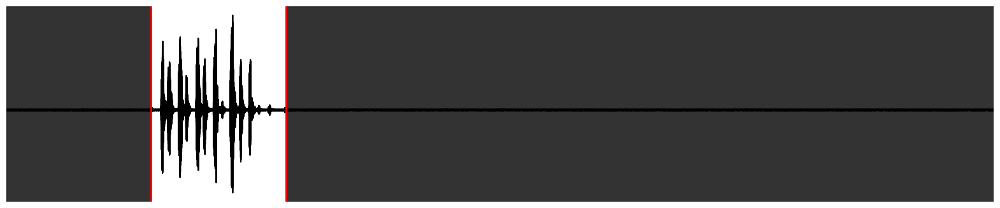

In [247]:
plot_and_play_wav('121210210333207977.WAV')

In [48]:
map_syllables_df(pup2mother_All, clusters_dendrogram)

,File name,SequenceSyl,Duration,Folder
0,121002212651151905.WAV,"[8, 2, 9]","[28341, 19373, 28746]",files201
1,121003075445185924.WAV,[9],[26746],files201
2,121004173718193940.WAV,"[9, 9, 9]","[26773, 27746, 25246]",files201
3,121005221219635013.WAV,"[7, 9, 9]","[26756, 36746, 39246]",files202
4,121006093630175196.WAV,[9],[28746],files202
...,...,...,...,...
1577,121217231303167058.WAV,[9],[46909],files210
1578,121217234551133060.WAV,[34],[51753],files210
1579,121209230635150780.WAV,[8],[61046],files209
1580,121210210333207977.WAV,[2],[48196],files209


In [ ]:
sample_files['File name'].unique().sahp

In [188]:
tmp[tmp['File name'] == '121005221219635013.WAV']

,segmentID,voc_segments,Folder,File name,sequenceID,start,end,syllableID,duration
7,7,"[-1.7418646e-05, -6.750579e-07, 2.114126e-05, ...",files202,121005221219635013.WAV,0,44263,71019,5,26756
8,8,"[-1.350816e-05, 1.4049836e-05, -6.4847577e-06,...",files202,121005221219635013.WAV,1,99273,136019,6,36746
9,9,"[8.698359e-06, -1.1321612e-05, 1.0857835e-05, ...",files202,121005221219635013.WAV,2,168273,207519,6,39246


In [192]:



tmp['duration'] = tmp['end'] - tmp['start']

tmp.set_index('File name').loc['121005221219635013.WAV']

tmp_file_seq = tmp.set_index('File name').loc['121005221219635013.WAV'].copy()
tmp_file_seq.reset_index(inplace=True)

# ensure sequence is sorted by increamental syllableID !
tmp_file_seq = tmp_file_seq.loc[tmp_file_seq['sequenceID'].sort_values().index]



sequences = tmp_file_seq['syllableID'].to_list()

durations = tmp_file_seq['duration'].to_list()

durations

,segmentID,voc_segments,Folder,File name,sequenceID,start,end,syllableID,duration
0,0,"[6.446875e-05, 4.4896227e-05, -0.00011276439, ...",files201,121002212651151905.WAV,0,37678,66019,6,28341
1,1,"[-2.3025896e-06, -7.829122e-06, 8.1741e-06, -2...",files201,121002212651151905.WAV,1,105273,124646,1,19373
2,2,"[-2.8932895e-06, -5.47872e-06, 1.1616736e-05, ...",files201,121002212651151905.WAV,2,179273,208019,6,28746
3,3,"[-3.794899e-06, -1.6078811e-05, 2.2058917e-05,...",files201,121003075445185924.WAV,0,46237,72983,6,26746
4,4,"[-1.5913945e-05, -3.0341653e-08, 2.945746e-05,...",files201,121004173718193940.WAV,0,48342,75115,6,26773
...,...,...,...,...,...,...,...,...,...
3692,3692,"[-2.6095164e-05, -8.122064e-06, 2.9972187e-05,...",files210,121217231303167058.WAV,0,41670,88579,21,46909
3693,3693,"[-2.6739226e-06, 5.417502e-06, -1.45972235e-05...",files210,121217234551133060.WAV,0,33141,84894,16,51753
3694,3694,"[1.4897312e-05, -4.8678376e-06, 5.073974e-06, ...",files209,121209230635150780.WAV,0,37437,98483,15,61046
3695,3695,"[2.3074608e-07, -1.3741694e-05, -1.1886405e-06...",files209,121210210333207977.WAV,0,51744,99940,19,48196


In [168]:
tmp_ix

File name
121005221219635013.WAV    0
121005221219635013.WAV    1
121005221219635013.WAV    2
Name: sequenceID, dtype: int64

In [143]:
pd.DataFrame([[a,b,*c,*d] for a,b,c,d in series.values], columns=columns)


0       (files201, 121002212651151905.WAV, 0, 37678, 6...
1       (files201, 121002212651151905.WAV, 1, 105273, ...
2       (files201, 121002212651151905.WAV, 2, 179273, ...
3       (files201, 121003075445185924.WAV, 0, 46237, 7...
4       (files201, 121004173718193940.WAV, 0, 48342, 7...
                              ...                        
3692    (files210, 121217231303167058.WAV, 0, 41670, 8...
3693    (files210, 121217234551133060.WAV, 0, 33141, 8...
3694    (files209, 121209230635150780.WAV, 0, 37437, 9...
3695    (files209, 121210210333207977.WAV, 0, 51744, 9...
3696    (files209, 121211022010135151.WAV, 0, 33641, 7...
Name: voc_segments_ix, Length: 3697, dtype: object

In [ ]:
121103045057225251

In [112]:
pup2mother_All.tail()

,commonSourceID,voc_segments,voc_segments_ix,duration_segments,mfccs,mel_filtered,specs,labels.label_addressee,labels.label_context,Emitter
segmentID,,,,,,,,,,
3692,37,"[-2.6095164e-05, -8.122064e-06, 2.9972187e-05,...","(files210, 121217231303167058.WAV, 0, 41670, 8...",46909.0,"[[-545.08887, -525.39185, -515.76306, -515.358...",NaN,"[[0.0035819786, 0.009230218, 0.012670663, 0.01...",232,6,230
3693,38,"[-2.6739226e-06, 5.417502e-06, -1.45972235e-05...","(files210, 121217234551133060.WAV, 0, 33141, 8...",51753.0,"[[-561.4513, -559.8718, -560.2934, -560.8998, ...",NaN,"[[0.0029338412, 0.005306011, 0.004094286, 0.00...",232,6,230
3694,0,"[1.4897312e-05, -4.8678376e-06, 5.073974e-06, ...","(files209, 121209230635150780.WAV, 0, 37437, 9...",61046.0,"[[-561.66754, -559.31836, -557.9643, -557.7261...",NaN,"[[0.005965381, 0.008655659, 0.0078096, 0.00805...",212,6,210
3695,1,"[2.3074608e-07, -1.3741694e-05, -1.1886405e-06...","(files209, 121210210333207977.WAV, 0, 51744, 9...",48196.0,"[[-542.8195, -534.5935, -536.5836, -547.09174,...",NaN,"[[0.0058841826, 0.010755239, 0.011369345, 0.00...",212,6,210
3696,2,"[2.1382024e-05, -7.755294e-06, 1.4935663e-05, ...","(files209, 121211022010135151.WAV, 0, 33641, 7...",43748.0,"[[-560.4033, -557.34595, -557.7388, -555.9712,...",NaN,"[[0.0064194025, 0.010328131, 0.010762211, 0.01...",212,6,210


In [125]:
for k in pup2mother_All['voc_segments_ix'].values:
    if k[1] == '121005221219635013.WAV':
        print(k)

('files202', '121005221219635013.WAV', 0, 44263, 71019)
('files202', '121005221219635013.WAV', 1, 99273, 136019)
('files202', '121005221219635013.WAV', 2, 168273, 207519)


In [132]:
for k, v in voc_syllables_clusters_ix.items():
    for k in v:
        if k[1][1] == '121005221219635013.WAV':
            print(k)

(6, ('files202', '121005221219635013.WAV', 1, 99273, 136019))
(6, ('files202', '121005221219635013.WAV', 2, 168273, 207519))
(5, ('files202', '121005221219635013.WAV', 0, 44263, 71019))


In [ ]:
for k, v in voc_syllables_clusters.items():
    for k in v:
        print(k)
        break

In [74]:
rate, data, start_times, end_times = get_wav_info('121005221219635013.WAV')


get_segments_ix('121005221219635013.WAV', start_times, end_times)

[('files202', '121005221219635013.WAV', 0, 44263, 71019),
 ('files202', '121005221219635013.WAV', 1, 99273, 136019),
 ('files202', '121005221219635013.WAV', 2, 168273, 207519)]

In [126]:
pup2mother_All.drop_duplicates(subset=["voc_segments_ix"], keep="first", inplace=True).shape

AttributeError: 'NoneType' object has no attribute 'shape'

In [125]:
pup2mother_All.shape

(3860, 9)

## Dictionaries

In [138]:
def plot_repertoire(symbolic_sequences, sub_title = ''):

    # flatten the sequences column and count the frequencies of each item
    items = symbolic_sequences['Sequence'].explode().value_counts().sort_values(ascending=False)

    # plot the bar chart
    fig, ax = plt.subplots(figsize=(8, 6))
    items.plot(kind='bar', ax=ax)

    # set axis labels and title
    ax.set_xlabel('Syllable-type')
    ax.set_ylabel('Frequency')
    ax.set_title(f'Distribution of Syllables in the Repertoire {sub_title}')

    # sort the x-axis based on the frequency of items
    sorted_items = items.index.tolist()
    ax.set_xticklabels(sorted_items, rotation=90)
    plt.show()
    

In [139]:
# Make symbolic sequences

In [141]:
filename_sequences = dict()

for c in voc_syllables_clusters_ix:
    for t in voc_syllables_clusters_ix[c]:
        folder_loc, filename, segment_ix, start, end = t
        
        if filename in filename_sequences:
            filename_sequences[filename]['Sequence'].append( c )
            filename_sequences[filename]['Duration'].append( end - start )
        else:
            filename_sequences[filename] = { 'Sequence' : [ c ] , 'Duration' : [ end - start ] , 'Folder' : folder_loc}

            
symbolic_sequences = pd.DataFrame(filename_sequences).T

symbolic_sequences.head()

,Sequence,Duration,Folder
121002212651151905.WAV,"[6, 6, 1]","[28341, 28746, 19373]",files201
121003075445185924.WAV,[6],[26746],files201
121004173718193940.WAV,"[6, 6, 6]","[26773, 27746, 25246]",files201
121005221219635013.WAV,"[6, 6, 5]","[36746, 39246, 26756]",files202
121006093630175196.WAV,[6],[28746],files202


In [142]:
file_info[file_info['File name'] =='121005221219635013.WAV']['voice_start_sample_4']

FileID
63549   NaN
Name: voice_start_sample_4, dtype: float64

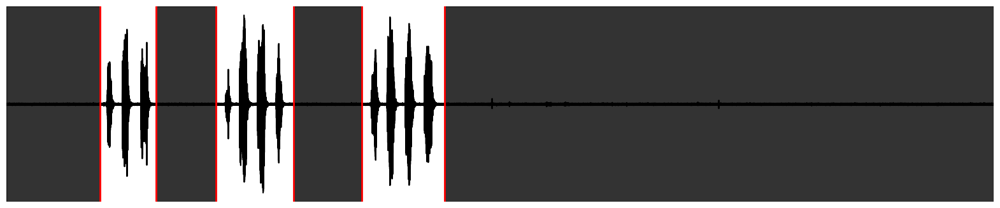

In [61]:
# Test
plot_and_play_wav('121005221219635013.WAV')

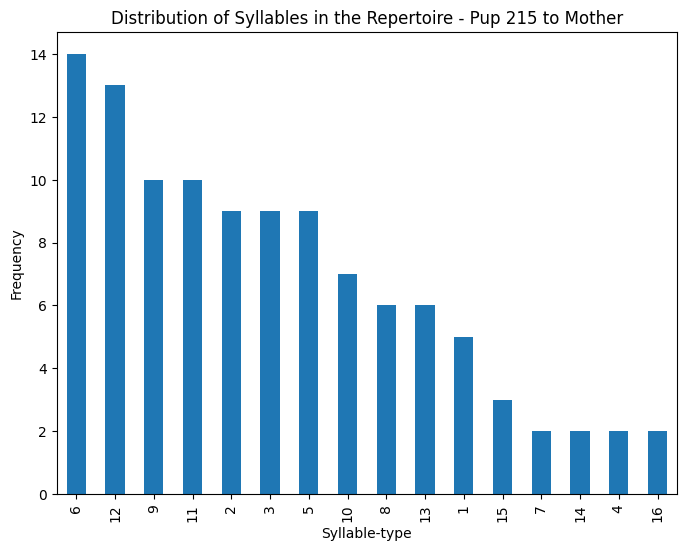

In [77]:
plot_repertoire(symbolic_sequences, sub_title = '- Pup 215 to Mother')

# Blackboard

In [20]:
ds = compute_dtw(pup2mother['mfccs'].to_list())

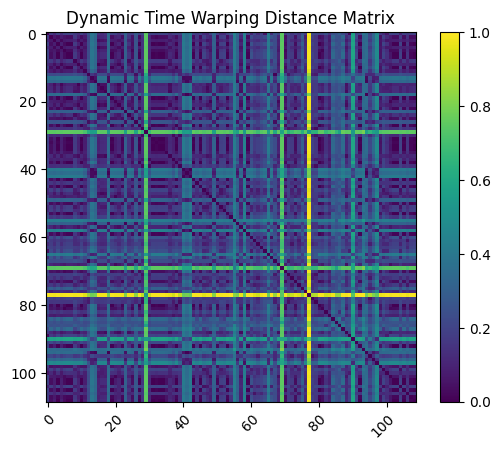

In [21]:
# mfcc OR mel_filtered ??
distances = dynamic_time_warping_by_mfcc(pup2mother['mfccs']) 

# normalize
distances = np.array(distances)
distances_norm = (distances-np.min(distances))/(np.max(distances)-np.min(distances))
        
# corr_matrix
n = int(np.sqrt(len(distances_norm)))
distances_norm = distances_norm.reshape(n,n)

#distances = softmax(distances)

# Plot correlation matrix
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots()
im = ax.imshow(distances_norm)

# Set axis labels and ticks
#ax.set_xticks(np.arange(len(mfccs)))
#ax.set_yticks(np.arange(len(mfccs)))
#ax.set_xticklabels(np.arange(1, len(mfccs)+1))
#ax.set_yticklabels(np.arange(1, len(mfccs)+1))

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# Set colorbar
cbar = ax.figure.colorbar(im, ax=ax)

# Show plot
plt.title('Dynamic Time Warping Distance Matrix')
plt.show()

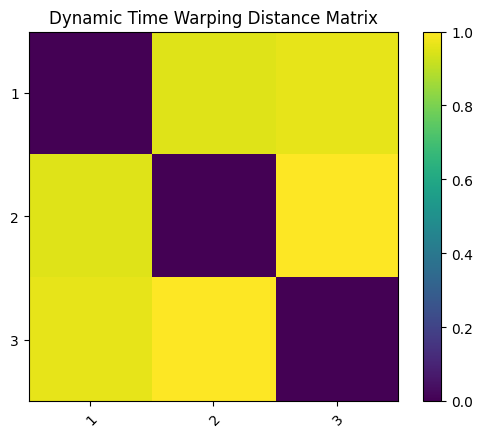

CPU times: user 1.01 s, sys: 3.22 s, total: 4.23 s
Wall time: 267 ms


In [116]:
%%time


# segments_audio
voc_segments = []

# segments_indexes
voc_segments_ix = []

#duration segments
duration_segments = []

# total_mfccs
mfccs = []

# total mel_filtered
mel_filtered = []

# spectrograms
specs = []



for name in file_info.loc[sample_fileIDs[:1]]['File name'].values:
    rate, data, start_times, end_times = get_wav_info(name)    
    
    y_filtered = butter_bandpass_filter(data)
    #y_filtered = data
    
    mfccs.extend(get_mfccs(y_filtered, rate, start_times, end_times))
    voc_segments.extend(get_segments_audio(y_filtered, rate, start_times, end_times))
    voc_segments_ix.extend(get_segments_ix(name, start_times, end_times))
    
    # too computational expensive?
    # mel_filtered.extend(get_mel_filterbanks(y_filtered, sr, start_times, end_times))
    
    segments, durations = get_segment_list(start_times, end_times)
    duration_segments.extend(durations)
    
    #specs.extend(get_segment_spectrogram(data, rate, start_times, end_times))
    
# mfcc OR mel_filtered ??
distances = dynamic_time_warping_by_mfcc(mfccs) 

# normalize
distances = np.array(distances)
distances_norm = (distances-np.min(distances))/(np.max(distances)-np.min(distances))
        
# corr_matrix
n = int(np.sqrt(len(distances_norm)))
distances_norm = distances_norm.reshape(n,n)

#distances = softmax(distances)

# Plot correlation matrix
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots()
im = ax.imshow(distances_norm)

# Set axis labels and ticks
ax.set_xticks(np.arange(len(mfccs)))
ax.set_yticks(np.arange(len(mfccs)))
ax.set_xticklabels(np.arange(1, len(mfccs)+1))
ax.set_yticklabels(np.arange(1, len(mfccs)+1))

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# Set colorbar
cbar = ax.figure.colorbar(im, ax=ax)

# Show plot
plt.title('Dynamic Time Warping Distance Matrix')
plt.show()

In [ ]:
# multipyling by their time ??

mfccs = [mfccs[i] * duration_segments[i].T for i in range(len(mfccs))]

distances_time = dynamic_time_warping_by_mfcc(mfccs) 

# normalize
distances_time = np.array(distances_time)
distances_time_norm = (distances_time-np.min(distances_time))/(np.max(distances_time)-np.min(distances_time))
        
# corr_matrix
n = int(np.sqrt(len(distances_time_norm)))
distances_time_norm = distances_time_norm.reshape(n,n)

#distances = softmax(distances)

# Plot correlation matrix
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots()
im = ax.imshow(distances_time_norm)

# Set axis labels and ticks
ax.set_xticks(np.arange(len(mfccs)))
ax.set_yticks(np.arange(len(mfccs)))
ax.set_xticklabels(np.arange(1, len(mfccs)+1))
ax.set_yticklabels(np.arange(1, len(mfccs)+1))

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# Set colorbar
cbar = ax.figure.colorbar(im, ax=ax)

# Show plot
plt.title('Dynamic Time Warping Distance Matrix')
plt.show()

In [ ]:
fig3, ax3 = plt.subplots()
ax3.set_title('Durations');
ax3.boxplot(duration_segments_norm)
plt.show()

In [173]:
import numpy as np
from sklearn.manifold import MDS
import matplotlib.pyplot as plt

# Use MDS to find a 2D representation of the distances
mds = MDS(n_components=2, dissimilarity='precomputed',  normalized_stress='auto')
pos = mds.fit_transform(distances)

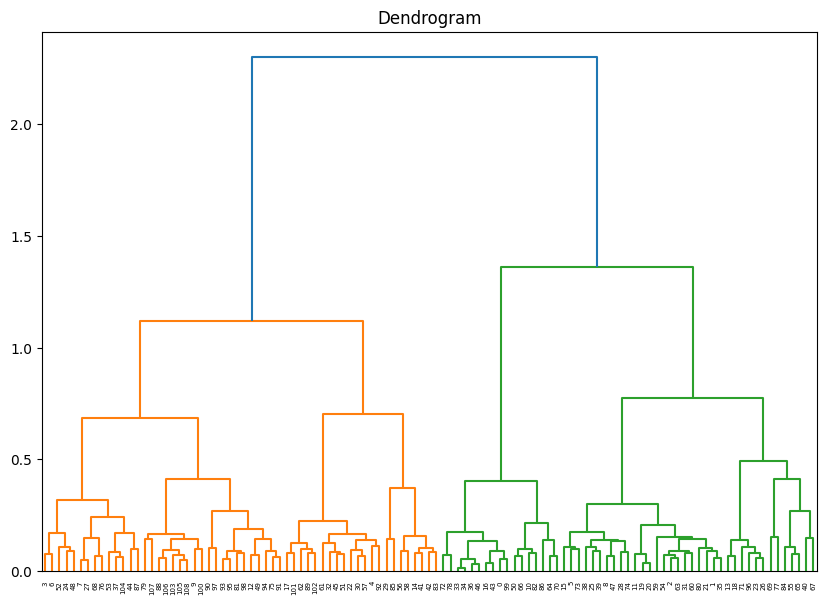

In [217]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.spatial.distance import squareform

# feeding directly the distances
ds = (ds-np.min(ds))/(np.max(ds)-np.min(ds))

condensed_dist = squareform(ds)

# Create dendrogram using hierarchical clustering
Z = linkage(condensed_dist, method='ward')
plt.figure(figsize=(10, 7))
plt.title("Dendrogram")

# Plot the dendrogram
dendrogram(Z, labels=None)
plt.show()

In [66]:
len(mfccs)

3452

In [227]:
t_step[index]

0.0

In [96]:
clusters_dendrogram

array([ 9, 12, 12,  1,  6, 11,  1,  2, 11,  3, 10, 12,  5, 13,  8, 11,  9,
        6, 13, 12, 12, 12,  6, 13,  1, 11, 13,  2, 11,  7,  6, 12,  6,  9,
        9, 12,  9,  2, 11, 11, 16,  8,  8,  9,  2,  6,  9, 11,  1,  5, 10,
        6,  1,  2, 12, 15,  8,  6,  8, 12, 12,  6,  6, 12, 10, 15, 10, 16,
        2, 14, 10, 13,  9, 11, 11,  5,  2, 14,  9,  3, 12,  5, 10,  8, 15,
        7, 10,  2,  3,  6,  4,  5,  6,  5,  5,  5, 13,  4,  5,  9,  3,  6,
        6,  3,  2,  3,  3,  3,  3], dtype=int32)

## Vocabulary of Syllables

In [ ]:
from IPython.display import HTML


# vocabulary using dendrogram

def voc_syllables(df, clusters):
    """
    Return 2 vocabularies:  voc_syllables_clusters, voc_syllables_clusters_ix
    
    voc_syllables_clusters:  voc of numpy audios
    voc_syllables_clusters_ix: voc of their Index in the DataFrame
    """

    voc_syllables_clusters = dict()
    voc_syllables_clusters_ix = dict()

    for i, s in enumerate(df['voc_segments']):
        c = clusters_dendrogram[i]
        if c in voc_syllables_clusters:
            voc_syllables_clusters[c].append(s)
            voc_syllables_clusters_ix[c].append(voc_segments_ix[i])
        else:
            voc_syllables_clusters[c] = [s]
            voc_syllables_clusters_ix[c] = [voc_segments_ix[i]]
        
# make a copy for comparison of clustering experiments
syllables_from_dendrograms_t = make_token(voc_syllables_clusters_ix.copy())

c = 3
[display(Audio(data = s, rate = 88200), HTML(f'{voc_syllables_clusters_ix[c][i]}')) for i, s in enumerate(voc_syllables_clusters[c])] 
   


In [56]:
t = 0.24

clusters_dendrogram = fcluster(Z, t, criterion='distance')

bars, freq = np.unique(clusters_dendrogram, return_counts=True)

In [ ]:
import pickle

  
store = {
    'classes' : classes,
    'voc_segments' : voc_segments,
    'duration_segments' : duration_segments,
    'mfccs' : mfccs,
    'distances' : distances,
    'distances_norm' : distances_norm
}


#with open('test.pkl','wb') as f:
#    pickle.dump(store, f)

In [75]:
with open('test.pkl','rb') as f:
    store = pickle.load(f)
    print(len(store))
    
classes = store['classes']
voc_segments = store['voc_segments']
voc_segments = store['voc_segments']
duration_segments = store['duration_segments']
mfccs = store['mfccs']
distances = store['distances']
distances_norm = store['distances_norm']

6


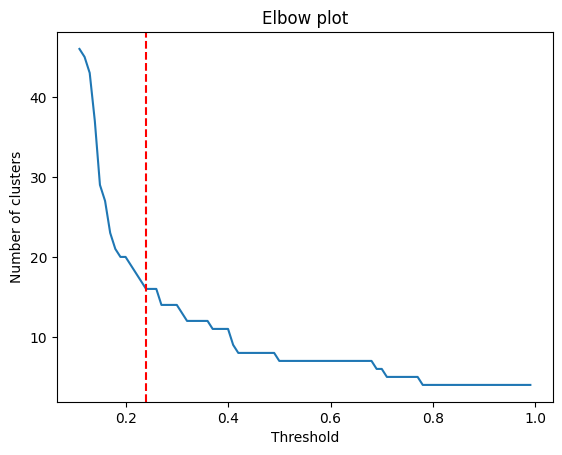

Elbow point:  (0.24, 16)


In [102]:
import numpy as np
from kneed import KneeLocator

t_step = np.arange(0, 1, .01)[11:]
c_size = [ len(np.unique(fcluster(Z, t, criterion='distance'))) for t in t_step]

# Find the elbow point using the KneeLocator function from the kneed library
kn = KneeLocator(t_step, c_size, curve='convex', direction='decreasing')

elbow_point = (kn.knee, kn.knee_y)

# plot the point
fig, ax = plt.subplots()
ax.plot(t_step, c_size)
ax.axvline(x=elbow_point[0], color='r', linestyle='--')
ax.set_xlabel('Threshold')
ax.set_ylabel('Number of clusters')
ax.set_title('Elbow plot')
plt.show()

print("Elbow point: ", elbow_point)

<BarContainer object of 16 artists>

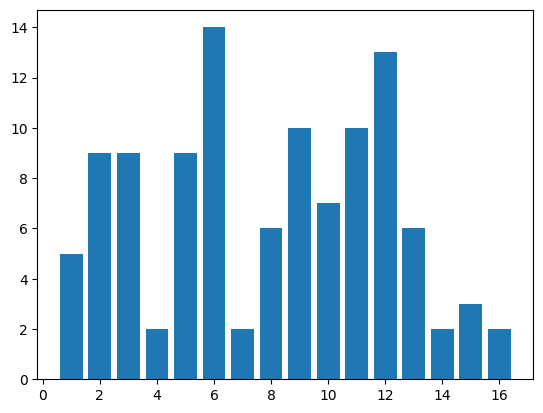

In [57]:
plt.bar(bars, freq)

(array([25., 31., 40., 13.]),
 array([ 1.  ,  4.75,  8.5 , 12.25, 16.  ]),
 <BarContainer object of 4 artists>)

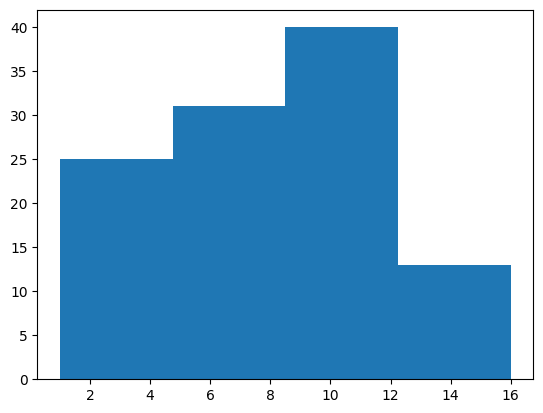

In [67]:
plt.hist(clusters_dendrogram, bins=4)

In [62]:
len(Z)

108

(array([1., 4., 1., 1., 2., 1., 3., 2., 0., 2.]),
 array([ 0. ,  1.4,  2.8,  4.2,  5.6,  7. ,  8.4,  9.8, 11.2, 12.6, 14. ]),
 <BarContainer object of 10 artists>)

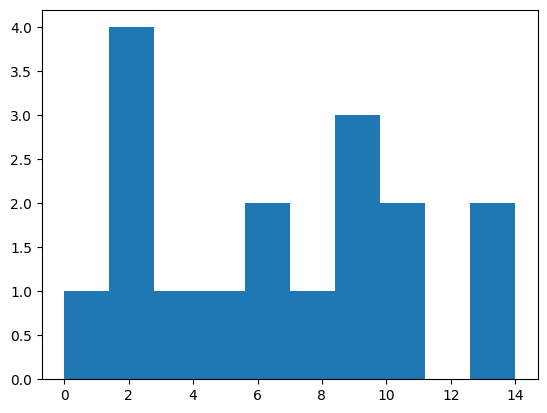

In [58]:
# this shows how many segments per syllables
plt.hist(np.bincount(clusters_dendrogram))

In [20]:
# trying to find clusters with hdbscan
# https://towardsdatascience.com/clustering-sentence-embeddings-to-identify-intents-in-short-text-48d22d3bf02e

In [76]:
import hdbscan

In [77]:
def pad_right(mfccs):
    # Determine the length of the longest MFCC
    max_len = max(len(mfcc[0]) for mfcc in mfccs)

    # Initialize array for padded/truncated MFCCs
    mfccs_fixed = np.zeros((len(mfccs), 20, max_len))

    # Pad or truncate MFCCs to fixed length
    for i, mfcc in enumerate(mfccs):
        if mfcc.shape[1] < max_len:
            # Pad MFCC with zeros
            mfccs_fixed[i, :, :mfcc.shape[1]] = mfcc
        #else:
        #    # Truncate MFCC
        #    mfccs_fixed[i, :, :] = mfcc[:, :max_len]
    return mfccs_fixed

In [78]:
def generate_clusters(message_embeddings,
                      n_neighbors,
                      n_components, 
                      min_cluster_size,
                      random_state = None):
    """
    Generate HDBSCAN cluster object after reducing embedding dimensionality with UMAP
    """

    umap_embeddings = (umap.UMAP(n_neighbors=n_neighbors, 
                                n_components=n_components, 
                                metric='cosine', 
                                random_state=random_state)
                            .fit_transform(message_embeddings))

    clusters = hdbscan.HDBSCAN(min_cluster_size = min_cluster_size,
                               metric='euclidean', 
                               cluster_selection_method='eom').fit(umap_embeddings)

    return clusters

In [79]:
def score_clusters(clusters, prob_threshold = 0.05):
    """
    Returns the label count and cost of a given cluster supplied from running hdbscan
    """
    
    cluster_labels = clusters.labels_
    label_count = len(np.unique(cluster_labels))
    total_num = len(clusters.labels_)
    cost = (np.count_nonzero(clusters.probabilities_ < prob_threshold)/total_num)
    
    return label_count, cost

In [93]:
import random 
def random_search(embeddings, space, num_evals):
    """
    Randomly search hyperparameter space and limited number of times 
    and return a summary of the results
    """
    
    results = []
    
    for i in range(num_evals):
        n_neighbors = random.choice(space['n_neighbors'])
        n_components = random.choice(space['n_components'])
        min_cluster_size = random.choice(space['min_cluster_size'])
        
        clusters = generate_clusters(embeddings, 
                                     n_neighbors = n_neighbors, 
                                     n_components = n_components, 
                                     min_cluster_size = min_cluster_size, 
                                     random_state = 42)
    
        label_count, cost = score_clusters(clusters, prob_threshold = 0.05)
                
        results.append([i, n_neighbors, n_components, min_cluster_size, 
                        label_count, cost])
    
    result_df = pd.DataFrame(results, columns=['run_id', 'n_neighbors', 'n_components', 
                                               'min_cluster_size', 'label_count', 'cost'])
    
    return result_df.sort_values(by='cost')

In [94]:
space = {
    'n_neighbors' : np.arange(12, 16,1),
    'n_components' : np.arange(2,5, 1),
    'min_cluster_size': np.arange(2, 16, 1),
    'random_state':42
}

In [95]:
# padded 
mfccs_fixed = pad_right(mfccs)

# Convert mfccs to a 2D array, skip first component
mfccs_flat = np.array([mfcc[0:].flatten() for mfcc in mfccs_fixed] )

In [96]:
random_use = random_search(mfccs_flat, space, 10)

In [97]:
random_use.head()

,run_id,n_neighbors,n_components,min_cluster_size,label_count,cost
4,4,13,4,5,197,0.060545
7,7,14,2,6,187,0.061414
8,8,12,4,7,177,0.061414
9,9,14,2,5,201,0.061703
0,0,13,2,6,188,0.064021


In [98]:
#use baysian optimisation to tune hyperparameters

def objective(params, embeddings, label_lower, label_upper):
    """
    Objective function for hyperopt to minimize, which incorporates constraints
    on the number of clusters we want to identify
    """
    
    clusters = generate_clusters(embeddings, 
                                 n_neighbors = params['n_neighbors'], 
                                 n_components = params['n_components'], 
                                 min_cluster_size = params['min_cluster_size'],
                                 random_state = params['random_state'])
    
    label_count, cost = score_clusters(clusters, prob_threshold = 0.05)
    
    #15% penalty on the cost function if outside the desired range of groups
    if (label_count < label_lower) | (label_count > label_upper):
        penalty = 0.15 
    else:
        penalty = 0
    
    loss = cost + penalty
    
    return {'loss': loss, 'label_count': label_count, 'status': STATUS_OK}

In [99]:
# Tree-Structured Parzen Estimator

def bayesian_search(embeddings, space, label_lower, label_upper, max_evals=100):
    """
    Perform bayseian search on hyperopt hyperparameter space to minimize objective function
    """
    
    trials = Trials()
    fmin_objective = partial(objective, embeddings=embeddings, label_lower=label_lower, label_upper=label_upper)
    best = fmin(fmin_objective, 
                space = space, 
                algo=tpe.suggest,
                max_evals=max_evals, 
                trials=trials)

    best_params = space_eval(space, best)
    print ('best:')
    print (best_params)
    print (f"label count: {trials.best_trial['result']['label_count']}")
    
    best_clusters = generate_clusters(embeddings, 
                                      n_neighbors = best_params['n_neighbors'], 
                                      n_components = best_params['n_components'], 
                                      min_cluster_size = best_params['min_cluster_size'],
                                      random_state = best_params['random_state'])
    
    return best_params, best_clusters, trials

In [100]:
hspace =  {
    'n_neighbors' : hp.choice( 'n_neighbors', np.arange(15, 50, 1)),
    'n_components' : hp.choice( 'n_components', np.arange(2, 5, 1)),
    'min_cluster_size': hp.choice( 'min_cluster_size', np.arange(2, 30, 1)),
    'random_state':42
}

best_params, best_clusters, trials = bayesian_search(mfccs_flat, hspace, 30, 100, max_evals=10)



TypeError: 'int' object is not callable

In [38]:
clusters = generate_clusters(mfccs_flat, 
                                     n_neighbors = 13, 
                                     n_components = 2, 
                                     min_cluster_size = 4, 
                                     random_state = 42)

In [101]:
# Dimensionality reduction with UMAP
reducer = umap.UMAP(n_components = 2, n_neighbors=13, min_dist=1, random_state=42, metric='euclidean')

# embedding
embedding = reducer.fit_transform(mfccs_flat)

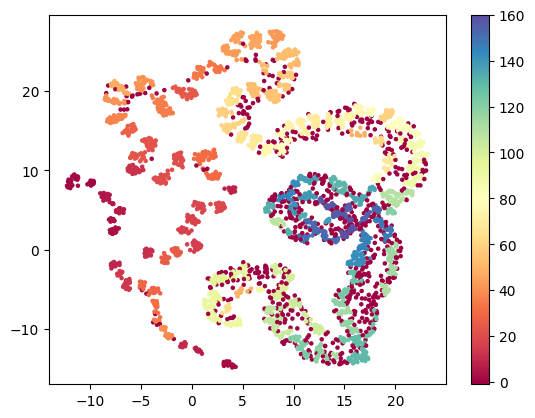

In [111]:
# Cluster the UMAP embedding using HDBSCAN
clusterer = hdbscan.HDBSCAN(min_cluster_size=5)
clusters_hdbscan_over_umap = clusterer.fit_predict(embedding)

# Visualize the clusters in the UMAP embedding
plt.scatter(embedding[:, 0], embedding[:, 1], c=clusterer.labels_, cmap='Spectral', s=5)
plt.colorbar()
plt.show()

In [110]:
np.unique(clusterer.labels_)

array([ -1,   0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,
        12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,
        25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,
        38,  39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,
        51,  52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,
        64,  65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,
        77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,
        90,  91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102,
       103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115,
       116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128,
       129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141,
       142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154,
       155, 156, 157, 158, 159, 160])

In [491]:
np.unique(cluster_labels).shape

NameError: name 'cluster_labels' is not defined

In [42]:
len(np.unique(cluster_labels))

48

(array([161.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.]),
 array([  5. ,  77.4, 149.8, 222.2, 294.6, 367. , 439.4, 511.8, 584.2,
        656.6, 729. ]),
 <BarContainer object of 10 artists>)

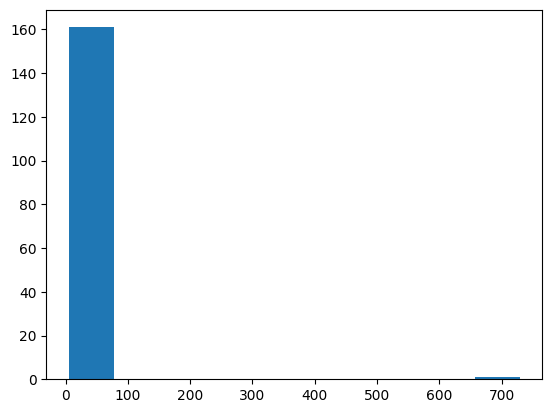

In [112]:
clusters_hdbscan_over_umap_2  = clusters_hdbscan_over_umap + 1
plt.hist(np.bincount(clusters_hdbscan_over_umap_2))

In [524]:
#hdbscan over umap, VS dendrograms using elbow
np.unique(clusters_hdbscan_over_umap), np.unique(clusters_dendrogram)

(array([0, 1]),
 array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15],
       dtype=int32))

In [493]:
np.bincount(clusters_hdbscan_over_umap_2), np.bincount(clusters_dendrogram)

NameError: name 'clusters_hdbscan_over_umap_2' is not defined

In [125]:
# TODO
# check this sound
#('files203', '121029231456383416.WAV', 3, 379841, 398245)

In [113]:
def make_token(syllables_dictionary):
    d = {}
    for k in syllables_dictionary:
        tuples = syllables_dictionary[k]
        new_tuples = []
        for t in tuples:
            new_tuples.append( ' '.join(map(str,t)))
                
        d.update({k : new_tuples})
    return d

In [114]:
voc_syllables_clusters.keys()

NameError: name 'voc_syllables_clusters' is not defined

In [234]:
from IPython.display import HTML
# vocabulary using dendrogram
#assert len(voc_segments) == len(voc_segments_ix)

voc_syllables_clusters = dict()
voc_syllables_clusters_ix = dict()

for i, s in enumerate(voc_segments):
    c = clusters_dendrogram[i]
    if c in voc_syllables_clusters:
        voc_syllables_clusters[c].append(s)
        voc_syllables_clusters_ix[c].append(voc_segments_ix[i])
    else:
        voc_syllables_clusters[c] = [s]
        voc_syllables_clusters_ix[c] = [voc_segments_ix[i]]
        
# make a copy for comparison of clustering experiments
syllables_from_dendrograms_t = make_token(voc_syllables_clusters_ix.copy())

c = 3
[display(Audio(data = s, rate = 88200), HTML(f'{voc_syllables_clusters_ix[c][i]}')) for i, s in enumerate(voc_syllables_clusters[c])] 
   


NameError: name 'voc_segments' is not defined

In [286]:
len(voc_segments_ix)

3697

In [123]:
from IPython.display import HTML
# vocabulary using hdscan umap
#assert len(voc_segments) == len(voc_segments_ix)

voc_syllables_clusters = dict()
voc_syllables_clusters_ix = dict()

for i, s in enumerate(voc_segments):
    c = clusters_hdbscan_over_umap[i]
    if c in voc_syllables_clusters:
        voc_syllables_clusters[c].append(s)
        voc_syllables_clusters_ix[c].append(voc_segments_ix[i])
    else:
        voc_syllables_clusters[c] = [s]
        voc_syllables_clusters_ix[c] = [voc_segments_ix[i]]

        
# make a copy for comparison of clustering experiments
syllables_from_hdbscan_over_umap_t = make_token(voc_syllables_clusters_ix.copy())

c = 1
[display(Audio(data = s, rate = 88200), HTML(f'{voc_syllables_clusters_ix[c][i]}')) for i, s in enumerate(voc_syllables_clusters[c])] 
                                             

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [75]:
#syllables_from_dendrograms = voc_syllables_clusters_ix.copy()

#syllables_from_dendrograms_t = make_token(voc_syllables_clusters_ix.copy())

#syllables_from_hdbscan_over_umap_t = make_token(voc_syllables_clusters_ix.copy())
#syllables_from_dendrograms_t = syllables_from_dendrograms_bkp.copy()
#syllables_from_hdbscan_over_umap_t = syllables_from_hdbscan_over_umap_bkp.copy()


In [537]:
# Compare the two approaches for clustering, if they are more or less equivalent

from itertools import product
from sklearn.metrics import jaccard_score, adjusted_rand_score, normalized_mutual_info_score, adjusted_mutual_info_score

A = syllables_from_dendrograms_t
B = syllables_from_hdbscan_over_umap_t


# Get all pairwise combinations of clusters in A and B
combinations = list(product(A.values(), B.values()))

max_element_in_clusters = max([len(A), len(B)])

comparison_matrix = np.zeros((max_element_in_clusters, max_element_in_clusters))


# Calculate ARI for each combination and print the results
for i, (a, b) in enumerate(combinations):
    
    tmp_a = a.copy()
    tmp_b = b.copy()
    
    # Find length of longer list
    max_len = max(len(tmp_a), len(tmp_b))

    # Pad list1 with None values
    
    while len(tmp_a) < max_len:
        tmp_a.append('XXX')

    # Pad list2 with None values
    
    while len(tmp_b) < max_len:
        tmp_b.append('YYY')
        
    
    #jcs = jaccard_score(tmp_a, tmp_b, average = 'micro')
    jcc = len(set(a).intersection(b)) / len(set(a).union(b))
    
    #ari = adjusted_rand_score(tmp_a, tmp_b)
    del tmp_a
    del tmp_b
    
    #nmi = normalized_mutual_info_score(a, b)
    #ami = adjusted_mutual_info_score(a, b)
    #print(f"ARI between A cluster {i//len(B)+1} and B cluster {i%len(B)+1}: {ari}")
    #print(f"NMI between A cluster {i//len(B)+1} and B cluster {i%len(B)+1}: {nmi}")
    #print(f"AMI between A cluster {i//len(B)+1} and B cluster {i%len(B)+1}: {ami}")
    comparison_matrix[-1 + i//len(B)+1][-1 + i%len(B)+1] = jcc

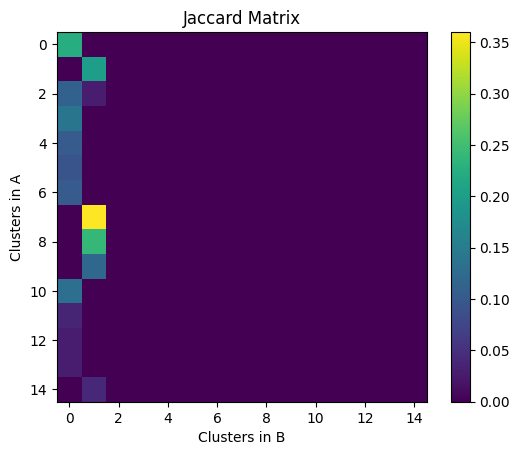

In [538]:
# Create a heatmap of the matrix
fig, ax = plt.subplots()
im = ax.imshow(comparison_matrix, cmap='viridis')

# Add colorbar
cbar = ax.figure.colorbar(im, ax=ax)

# Set axis labels
#ax.set_xticks(np.arange(n))
#ax.set_yticks(np.arange(n))
#ax.set_xticklabels(np.arange(1, n+1))
#ax.set_yticklabels(np.arange(1, n+1))
ax.set_xlabel('Clusters in B')
ax.set_ylabel('Clusters in A')

# Rotate the tick labels and set their alignment
#plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# Loop over data dimensions and create text annotations
#n = len(ari_matrix)
#for i in range(n):
#    for j in range(n):
#        text = ax.text(j, i, f'{ari_matrix[i, j]:.2f}', ha="center", va="center", color="w")

# Set title and show plot
ax.set_title("Jaccard Matrix")
#fig.tight_layout()
plt.show()

In [98]:
# padded 
mfccs_fixed = pad_right(mfccs)

# Convert mfccs to a 2D array, skip first component
mfccs_flat = np.array([mfcc[0:].flatten() for mfcc in mfccs_fixed] )

# Dimensionality reduction with UMAP
#reducer = umap.UMAP(n_components = 5, n_neighbors=15, min_dist=0.1, random_state=42, metric='euclidean')

# embedding
#embedding = reducer.fit_transform(mfccs_flat)

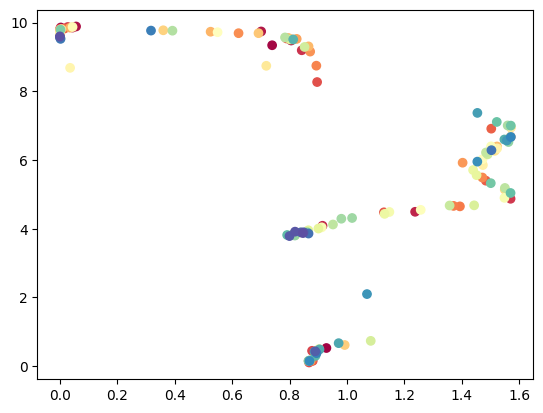

In [540]:
#https://umap-learn.readthedocs.io/en/latest/embedding_space.html

gaussian_mapper = umap.UMAP(output_metric='gaussian_energy',
                            n_components=2,
                            random_state=42).fit(mfccs_flat)

plt.scatter(gaussian_mapper.embedding_.T[0], gaussian_mapper.embedding_.T[1], c=[i for i, _ in enumerate(np.array(classes))], cmap='Spectral')
                                   

In [ ]:
reducer = umap.UMAP(n_components = 2, n_neighbors=15, min_dist=1., random_state=42,  metric='euclidean')
mapper = reducer.fit(mfccs_flat)
embedding = reducer.fit_transform(mfccs_flat)
umap.plot.points(mapper, labels= np.array(classes))

# dictionaries

In [328]:
#assert len(voc_segments) == len(voc_segments_ix)

voc_syllables_clusters = dict()
voc_syllables_clusters_ix = dict()

for i, s in enumerate(voc_segments):
    c = clusters_dendrogram[i]
    if c in voc_syllables_clusters:
        voc_syllables_clusters[c].append(s)
        voc_syllables_clusters_ix[c].append(voc_segments_ix[i])
    else:
        voc_syllables_clusters[c] = [s]
        voc_syllables_clusters_ix[c] = [voc_segments_ix[i]]
    
    

In [329]:
len(voc_syllables_clusters_ix)

218

In [104]:
c = 54
[display(Audio(data = s, rate = 88200)) for s in voc_syllables_clusters[c]]

[None, None, None, None, None]

In [172]:
# make symbolic sequences!

In [330]:
filename_sequences = dict()

for c in voc_syllables_clusters_ix:
    for t in voc_syllables_clusters_ix[c]:
        folder_loc, filename, segment_ix, start, end = t
        
        if filename in filename_sequences:
            filename_sequences[filename]['Sequence'].append( c )
            filename_sequences[filename]['Duration'].append( end - start )
        else:
            filename_sequences[filename] = { 'Sequence' : [ c ] , 'Duration' : [ end - start ] , 'Folder' : folder_loc}

            
symbolic_sequences = pd.DataFrame(filename_sequences).T

symbolic_sequences.head()

,Sequence,Duration,Folder
121002212651151905.WAV,"[74, 74, 74]","[28341, 19373, 28746]",files201
121025123355735792.WAV,"[74, 140, 119, 104]","[38246, 38246, 45681, 18488]",files203
121118001600376382.WAV,"[74, 217, 125, 92, 188, 61]","[18251, 18561, 27287, 6891, 23113, 25197]",files206
121205191416401087.WAV,"[74, 59, 211, 215, 158, 55, 131, 66, 67, 37]","[27326, 25330, 14445, 17260, 14920, 12746, 168...",files208
121212192015723327.WAV,"[74, 211, 169]","[7120, 15265, 22677]",files209


In [331]:
symbolic_sequences['Sequence']

121002212651151905.WAV                                    [74, 74, 74]
121025123355735792.WAV                             [74, 140, 119, 104]
121118001600376382.WAV                     [74, 217, 125, 92, 188, 61]
121205191416401087.WAV    [74, 59, 211, 215, 158, 55, 131, 66, 67, 37]
121212192015723327.WAV                                  [74, 211, 169]
                                              ...                     
121209190802233982.WAV                                            [56]
121202222620111221.WAV                                           [132]
121205195459786143.WAV                                           [132]
121207193222097550.WAV                                            [12]
121212021928250359.WAV                                             [4]
Name: Sequence, Length: 1493, dtype: object

In [133]:
pd.set_option('display.min_rows', 72)
symbolic_sequences
pd.reset_option('display.min_rows')

In [60]:
# Test

rate , audio, start_times, end_times = get_wav_info('121118001600376382.WAV')
Audio(data=audio, rate=88200)

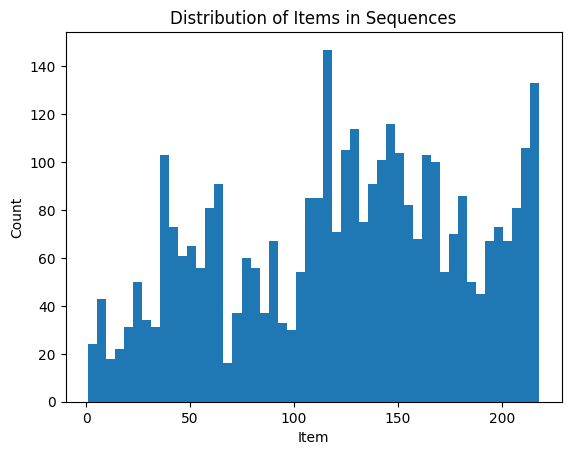

In [336]:
# Flatten sequences into a single list
all_sequences = [item for sublist in symbolic_sequences['Sequence'] for item in sublist]

# Plot histogram
plt.hist(all_sequences, bins=50)
plt.xlabel('Item')
plt.ylabel('Count')
plt.title('Distribution of Items in Sequences')
plt.show()

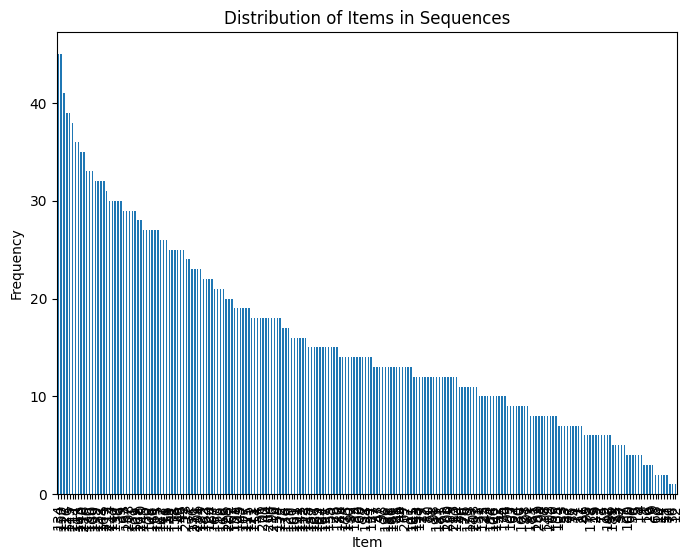

In [337]:
# flatten the sequences column and count the frequencies of each item
items = symbolic_sequences['Sequence'].explode().value_counts().sort_values(ascending=False)

# plot the bar chart
fig, ax = plt.subplots(figsize=(8, 6))
items.plot(kind='bar', ax=ax)

# set axis labels and title
ax.set_xlabel('Item')
ax.set_ylabel('Frequency')
ax.set_title('Distribution of Items in Sequences')

# sort the x-axis based on the frequency of items
sorted_items = items.index.tolist()
ax.set_xticklabels(sorted_items, rotation=90)
plt.show()

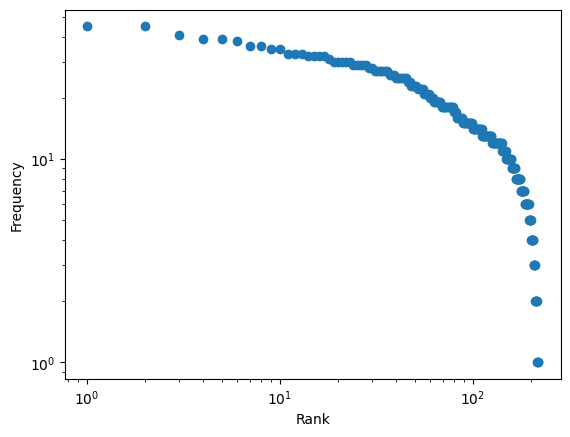

In [338]:
# get the frequency counts of items
counts = symbolic_sequences['Sequence'].explode().value_counts()

# sort the items by their frequency
sorted_items = counts.index.to_list()
sorted_items.sort(key=lambda x: counts[x], reverse=True)

# get the frequency counts and ranks
freq = counts[sorted_items].values
rank = np.arange(1, len(sorted_items)+1)

# Create a list of all the items in the sequences
items = []
for seq in symbolic_sequences['Sequence']:
    items += seq

# Get frequency distribution of items
counts = pd.Series(items).value_counts().sort_values(ascending=False)

# Plot log-log plot
fig, ax = plt.subplots()
ax.loglog(range(1, len(counts) + 1), counts.values, 'o')
ax.set_xlabel('Rank')
ax.set_ylabel('Frequency')
plt.show()



In [149]:
# Create a pandas Series object from the flattened list of sequences
seq_series = pd.Series(all_sequences)

# Get statistical description
description = seq_series.describe()

print(description)

count    3452.000000
mean       18.775492
std         7.888660
min         1.000000
25%        14.000000
50%        20.000000
75%        24.000000
max        31.000000
dtype: float64


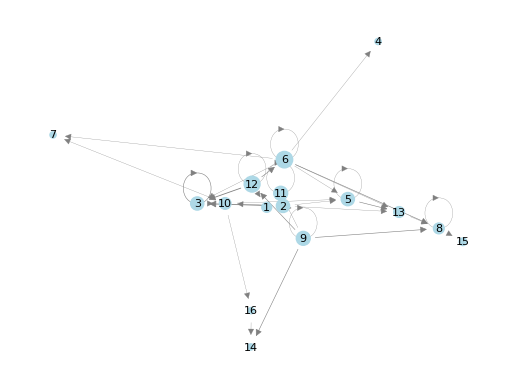

In [152]:
import networkx as nx
# Create a dictionary to count the items and transitions
item_counts = {}
transition_counts = {}

# Iterate over the sequences and update the counts
for seq in symbolic_sequences['Sequence']:
    for i, item in enumerate(seq):
        # Update item counts
        if item not in item_counts:
            item_counts[item] = 1
        else:
            item_counts[item] += 1
        
        # Update transition counts
        if i > 0:
            transition = (seq[i-1], item)
            if transition not in transition_counts:
                transition_counts[transition] = 1
            else:
                transition_counts[transition] += 1

# Create a directed graph using NetworkX
G = nx.DiGraph()

# Add nodes with sizes proportional to their counts
for item, count in item_counts.items():
    G.add_node(item, size=count)

# Add edges with sizes proportional to their counts
for transition, count in transition_counts.items():
    G.add_edge(*transition, weight=count)

# Create a layout for the graph
#pos = nx.spring_layout(G, k=0.3)
pos = nx.spring_layout(G)


# Draw the nodes with sizes proportional to their counts
node_sizes = [count * 10 for count in item_counts.values()]
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='lightblue')

# Draw the edges with sizes proportional to their counts
edge_widths = [count * 0.2 for count in transition_counts.values()]
nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color='gray', arrowsize=10)

# Draw labels for the nodes
nx.draw_networkx_labels(G, pos, font_size=8, font_family='sans-serif')

# Remove the axis
plt.axis('off')

# Show the plot
plt.show()

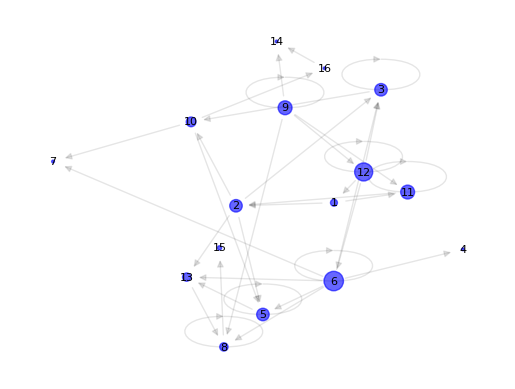

In [151]:
from collections import Counter

# Compute the directed graph
seq = symbolic_sequences['Sequence'].tolist()
edges = [(seq[i][j], seq[i][j+1]) for i in range(len(seq)) for j in range(len(seq[i])-1)]
G = nx.DiGraph()
G.add_edges_from(edges)

# Count the occurrences of each node
counts = Counter([item for sublist in seq for item in sublist])

# Compute the node sizes based on their counts
node_sizes = [counts[node]**2 for node in G.nodes()]

# Compute the node positions using a circular layout
pos = nx.spring_layout(G)

# Adjust the positions based on the node degrees
for node, degree in G.degree:
    pos[node] *= (degree + 1) * 10

# Draw the graph
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='blue', alpha=0.6)
nx.draw_networkx_edges(G, pos, width=1, alpha=0.1, arrowsize=10)
nx.draw_networkx_labels(G, pos, font_size=8, font_family='sans-serif')
plt.axis('off')
plt.show()

/tmp/ipykernel_826237/3878603939.py:34: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(embedding[:, 0], embedding[:, 1],  cmap='Spectral', s=10)


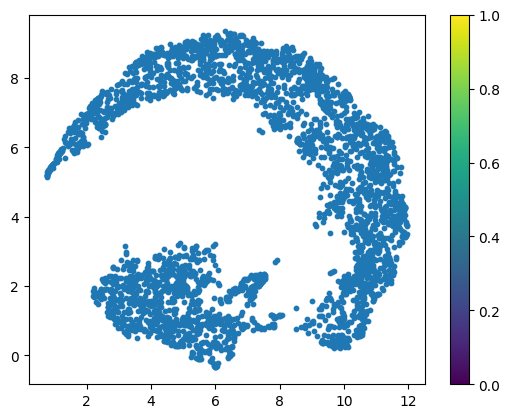

In [113]:
# Determine the length of the longest MFCC
max_len = max(len(mfcc[0]) for mfcc in mfccs)

# Initialize array for padded/truncated MFCCs
mfccs_fixed = np.zeros((len(mfccs), 20, max_len))

# Pad or truncate MFCCs to fixed length
for i, mfcc in enumerate(mfccs):
    if mfcc.shape[1] < max_len:
        # Pad MFCC with zeros
        mfccs_fixed[i, :, :mfcc.shape[1]] = mfcc
    #else:
    #    # Truncate MFCC
    #    mfccs_fixed[i, :, :] = mfcc[:, :max_len]
    
    
import umap
import umap.plot
from sklearn.cluster import KMeans

# Convert mfccs to a 2D array, skip first component
mfccs_flat = [mfcc[1:].flatten() for mfcc in mfccs_fixed]

# Dimensionality reduction with UMAP
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42, metric='euclidean')

# embedding
embedding = reducer.fit_transform(mfccs_flat)

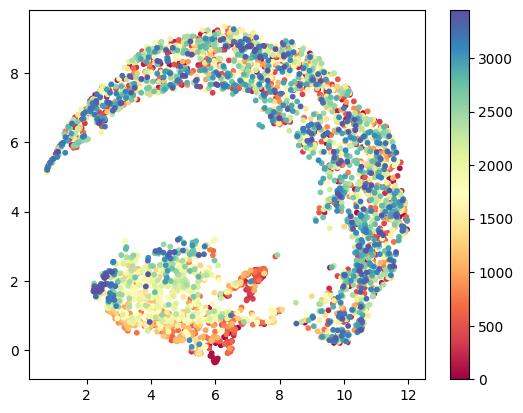

In [123]:
import matplotlib.pyplot as plt

# Plot UMAP embeddings
plt.scatter(embedding[:, 0], embedding[:, 1], c=range(len(np.array(context_classes))), cmap='Spectral', s=10)
plt.colorbar()
plt.show()

<Axes: >

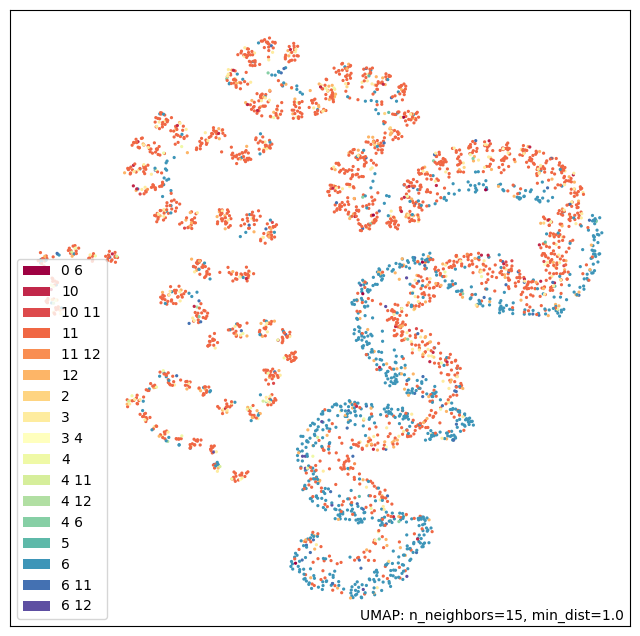

In [122]:
umap.plot.points(mapper, labels= np.array(context_classes))

Trustworthiness: 0.972520067445616


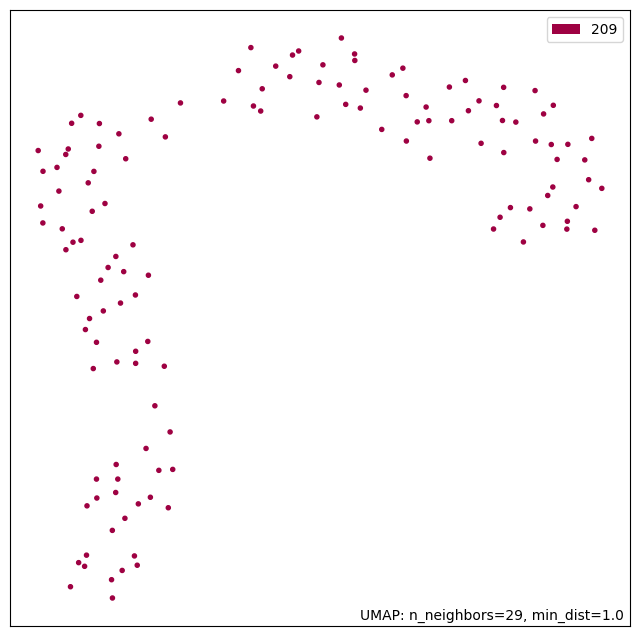

In [578]:
from sklearn.manifold import trustworthiness



mfccs_flat = np.array([mfcc[0:].flatten() for mfcc in mfccs_fixed])


reducer = umap.UMAP(min_dist=1., random_state=42, n_neighbors=29, metric='euclidean')
mapper = reducer.fit(mfccs_flat)
embedding = reducer.fit_transform(mfccs_flat)
umap.plot.points(mapper, labels= np.array(classes))


trust = trustworthiness(mfccs_flat, embedding, n_neighbors=29)
#cont = continuity(dist_umap / dist_orig)

print("Trustworthiness:", trust)

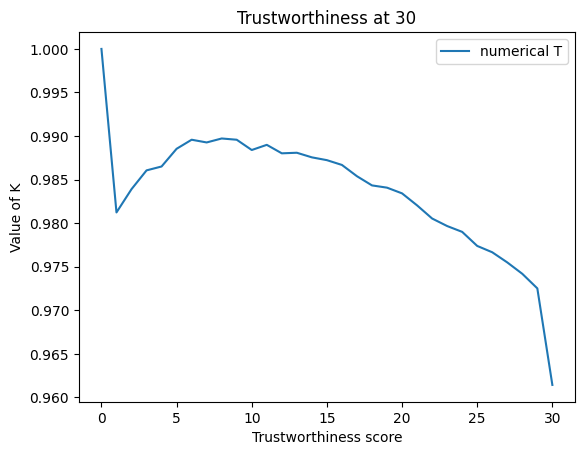

In [579]:
from umap import validation

K = 30

numerical_trustworthiness = validation.trustworthiness_vector(source=np.array(mfccs_flat)
                                  ,embedding=embedding
                                  ,max_k=K)

#categorical_trustworthiness = validation.trustworthiness_vector(source=np.array(mfccs_flat),embedding=embedding ,max_k=K)


_=plt.plot(numerical_trustworthiness)
#_=plt.plot(categorical_trustworthiness)
_=plt.ylabel("Value of K")
_= plt.xlabel(f"Trustworthiness score")
_=plt.title(f"Trustworthiness at {K}")
_=plt.legend(["numerical T"], loc="upper right")

In [581]:
from sklearn.decomposition import PCA

# Concatenate the matrices along the columns to form a single matrix
mfcc_matrix = np.vstack(mfccs_fixed)
#mfcc_matrix = mfccs_fixed

# Apply PCA to the matrix
pca = PCA()
pca.fit(mfcc_matrix)

# Select the first two principal components and project them onto UMAP
#mfcc_pca = pca.transform(mfcc_matrix.T)[:, :2]
#umap_embedding = umap.UMAP().fit_transform(mfcc_pca)

PCA()

In [582]:
# List of MFCC
#mfcc_list = [...]  # replace [...] with your MFCC data

# Convert list of MFCC to numpy array
#mfcc_array = np.array(mfcc_list)

# Apply PCA
pca = PCA()
pca.fit(mfccs_fixed[7])

# Get explained variance ratio for each component
explained_var_ratio = pca.explained_variance_ratio_

# Print explained variance ratio for each component
print(explained_var_ratio)

[9.86447705e-01 9.91299478e-03 1.00934388e-03 6.37420242e-04
 4.53278808e-04 3.05723870e-04 2.76773568e-04 1.94411248e-04
 1.91023473e-04 1.44590306e-04 1.04717819e-04 8.95216299e-05
 5.84994517e-05 5.21054627e-05 3.83233792e-05 2.99520893e-05
 2.37318696e-05 2.00174155e-05 9.86581510e-06 6.31080636e-34]


In [583]:
mfccs_fixed.shape

(132, 20, 240)

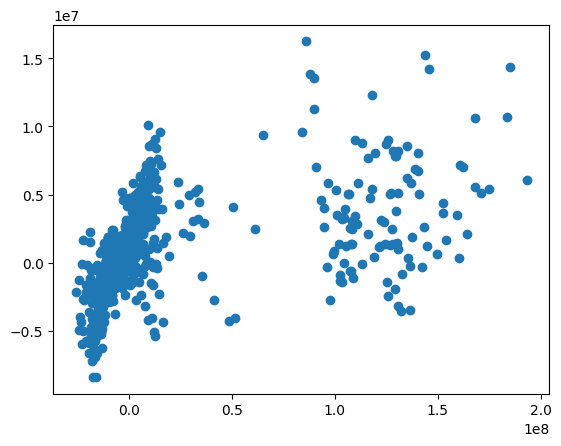

In [584]:
mfcc_pca = pca.transform(mfcc_matrix)[:, :2]
plt.scatter(mfcc_pca[:,0], mfcc_pca[:,1])

In [585]:
# find the principal component with the highest proportion of variance
variance_ratios = pca.explained_variance_ratio_
max_var_idx = np.argmax(variance_ratios)

# examine the corresponding eigenvector
eigenvectors = pca.components_
max_var_eigenvector = eigenvectors[max_var_idx]

# plot the scores of the samples along the first two principal components
scores = pca.transform(X)[:, :2]

NameError: name 'X' is not defined

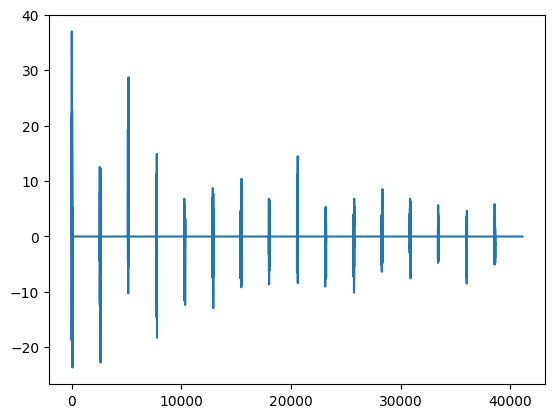

In [46]:
plt.plot(mfccs_fixed[23][4:].flatten())

In [580]:
from sklearn.cluster import DBSCAN 

dbscan = DBSCAN(eps=.05, min_samples=5).fit(pos)

# Plot DBSCAN results
plt.scatter(embedding[:, 0], embedding[:, 1], c=[i for i in range(len(classes))], cmap='Spectral', s=5)
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.title("DBSCAN Clustering Results")
plt.show()

ValueError: Expected 2D array, got scalar array instead:
array={15: array([ 1.10000000e+03, -6.55651111e-06]), 2: array([365.41817089, 162.69465915]), 13: array([468.39138794, 520.20141968]), 10: array([247.2135623 , 760.84524916]), 5: array([-94.07568681, 895.06974474]), 14: array([-250.00005141,  433.01270361]), 4: array([-809.0170547 ,  587.78525496]), 11: array([-1173.77721949,   249.49393276]), 12: array([-782.51809865, -166.32944109]), 1: array([-728.11529558, -529.00679384]), 6: array([ -99.99999076, -173.20509575]), 3: array([ -31.35850863, -298.35658516]), 7: array([  92.70513057, -285.31695413]), 9: array([ 133.8261466 , -148.62894367]), 8: array([ 365.41821857, -162.69460432])}.
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [125]:
from IPython.display import Audio, HTML, display


i, k = 1, 37
display(Audio(data = voc_segments[i], rate = 88200), Audio(data = voc_segments[k], rate = 88200) )

In [71]:
def LB_Keogh(s1,s2,r):
    LB_sum=0
    for ind,i in enumerate(s1):
        
        lower_bound=min(s2[(ind-r if ind-r>=0 else 0):(ind+r)])
        upper_bound=max(s2[(ind-r if ind-r>=0 else 0):(ind+r)])
        
        if i>upper_bound:
            LB_sum=LB_sum+(i-upper_bound)**2
        elif i<lower_bound:
            LB_sum=LB_sum+(i-lower_bound)**2
    
    return sqrt(LB_sum)

In [133]:
import numpy as np
from tslearn.metrics import lb_keogh

# Generate two example spectrogram matrices


In [167]:
distances_specs = [] 
distances_specs_dwt = []

for spec1 in specs[:10]:
    for spec2 in specs[:10]:
        max_time = max(spec1.shape[1], spec2.shape[1])
        spec1_padded = np.pad(spec1, ((0, 0), (0, max_time - spec1.shape[1])), 'constant')
        spec2_padded = np.pad(spec2, ((0, 0), (0, max_time - spec2.shape[1])), 'constant')
        
        d = lb_keogh(spec1_padded.flatten(), spec2_padded.flatten(), radius=10) 
        distances_specs.append(d)

        D, wp = librosa.sequence.dtw(spec1, spec2)
        distances_specs_dwt.append(D[wp[-1, 0], wp[-1, 1]])
        
distances_specs, distances_specs_dwt

KeyboardInterrupt: 

In [160]:
distances_specs

0.0

In [73]:
for x in test:
    for y in test:
        LB_Keogh(x,y,20)

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [74]:
x.shape

(2049, 3364)

In [75]:
y.shape

(2049, 3364)

In [103]:
import librosa
import numpy as np
import umap

# Load audio file
#y, sr = librosa.load('example.wav')

y, sr = data, rate

# Apply bandpass filter
y_filtered = butter_bandpass_filter(data, 1000, 120000, sr, order=5)

# Compute MFCCs and chroma features for segments of different durations
win_sizes = [0.1, 0.5, 1.0] # duration of segments in seconds
n_mfcc = 13
n_chroma = 12

mfccs = []
chromas = []

for win_size in win_sizes:
    win_length = int(win_size * sr)
    hop_length = int(win_length / 2)
    mfcc = librosa.feature.mfcc(y_filtered, sr=sr, n_mfcc=n_mfcc, n_fft=win_length, hop_length=hop_length)
    chroma = librosa.feature.chroma_stft(y_filtered, sr=sr, n_chroma=n_chroma, n_fft=win_length, hop_length=hop_length)
    mfccs.append(mfcc)
    chromas.append(chroma)

# Pad arrays to have same dimensions
max_frames = max([mfcc.shape[1] for mfcc in mfccs] + [chroma.shape[1] for chroma in chromas])

mfccs_padded = []
chromas_padded = []

for mfcc, chroma in zip(mfccs, chromas):
    mfcc_pad_width = ((0, 0), (0, max_frames - mfcc.shape[1]))
    chroma_pad_width = ((0, 0), (0, max_frames - chroma.shape[1]))
    mfcc_padded = np.pad(mfcc, pad_width=mfcc_pad_width, mode='constant')
    chroma_padded = np.pad(chroma, pad_width=chroma_pad_width, mode='constant')
    mfccs_padded.append(mfcc_padded)
    chromas_padded.append(chroma_padded)

# Stack arrays
mfccs_stacked = np.stack(mfccs_padded, axis=2)
chromas_stacked = np.stack(chromas_padded, axis=2)

# Flatten arrays
mfccs_flattened = mfccs_stacked.reshape(mfccs_stacked.shape[0], -1)
chromas_flattened = chromas_stacked.reshape(chromas_stacked.shape[0], -1)

# Apply UMAP
mfccs_umap = umap.UMAP().fit_transform(mfccs_flattened)
chromas_umap = umap.UMAP().fit_transform(chromas_flattened)

TypeError: mfcc() takes 0 positional arguments but 1 positional argument (and 2 keyword-only arguments) were given

### Test HMM and Power-Law

In [219]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sklearn.metrics import mutual_info_score
import powerlaw
import hmmlearn.hmm as hmm

# Define the threads
threads = [
    [12, 2, 12, 12, 3, 5],
    [2, 12],
    [2,3,5,5],
    [3,4],
    [2,5,5,5]
]

# Define the order of HMM to test
hmm_orders = [1, 2, len(threads[0])]

# Define the power law fit range
power_law_range = [1, len(threads[0]) // 2]

# Loop over each thread
for thread in threads:
    # Calculate the mutual information
    mutual_infos = [mutual_info_score(thread[:-i-1], thread[i+1:]) for i in range(len(thread)-1)]
    
    # Divide the sequence into two parts
    n = len(mutual_infos) // 2
    mi_1, mi_2 = mutual_infos[:n], mutual_infos[n:]
    
    # Fit the decay curve using HMM of different orders
    aic_scores = []
    for order in hmm_orders:
        model = hmm.MultinomialHMM(n_components=order)
        model.fit(np.array([mi_1]).T)
        aic_scores.append(model.score(np.array([mi_2]).T))
    
    best_hmm_order = np.argmin(aic_scores)
    model = hmm.MultinomialHMM(n_components=hmm_orders[best_hmm_order])
    model.fit(np.array([mi_1]).T)
    hmm_predicted = model.predict(np.array([mi_2]).T)
    
    # Fit the decay curve using power law function
    fit = powerlaw.Fit(mi_2, xmin=power_law_range[0], xmax=power_law_range[1])
    alpha = fit.alpha
    
    # Test if the sequence better follows a combination of HMM and power law decay
    hmm_count = [0] * hmm_orders[best_hmm_order]
    for i in range(len(hmm_predicted)):
        hmm_count[hmm_predicted[i]] += 1
    hmm_prob = [c / len(hmm_predicted) for c in hmm_count]
    
    if hmm_prob[0] < 0.5:
        print("The sequence better follows a combination of HMM and power law decay")
    else:
        print("The sequence does not follow a combination of HMM and power law decay")
    
    # Plot the results
    plt.figure()
    plt.plot(np.arange(len(mutual_infos)-1), mutual_infos)
    plt.axvline(n, linestyle='--', color='grey')
    plt.xlabel("Time lag")
    plt.ylabel("Mutual information")
    
    plt.twinx()
    plt.plot(np.arange(n, len(mutual_infos)), hmm_prob, '-o', label="HMM")

MultinomialHMM has undergone major changes. The previous version was implementing a CategoricalHMM (a special case of MultinomialHMM). This new implementation follows the standard definition for a Multinomial distribution (e.g. as in https://en.wikipedia.org/wiki/Multinomial_distribution). See these issues for details:
https://github.com/hmmlearn/hmmlearn/issues/335
https://github.com/hmmlearn/hmmlearn/issues/340


ValueError: Symbol counts should be nonnegative integers

In [215]:
# Scale the mutual information values and convert to integer counts
counts = np.round(mi_1 * 100).astype(int)

# Create an instance of the power-law model and fit the counts
model = powerlaw.Fit(counts)

# Get the alpha parameter of the power-law fit
alpha = model.alpha

# Print the alpha parameter
print(f"Alpha parameter for power-law fit: {alpha}")

Calculating best minimal value for power law fit
Alpha parameter for power-law fit: nan


Values less than or equal to 0 in data. Throwing out 0 or negative values
Less than 2 unique data values left after xmin and xmax options! Cannot fit. Returning nans.


In [216]:
from hmmlearn import hmm
import numpy as np

# define the number of hidden states
n_states = 3

# define the model
model = hmm.MultinomialHMM(n_components=n_states, n_iter=100)

# fit the model to the data
for thread in threads:
    # calculate the mutual information between adjacent elements in the thread
    mi_1 = mutual_information(thread[:-1], thread[1:])
    
    # normalize the mutual information to be between 0 and 1
    mi_1 = (mi_1 - mi_1.min()) / (mi_1.max() - mi_1.min())
    
    # estimate the transition matrix and the emission probabilities based on the mutual information
    transition_matrix = np.zeros((n_states, n_states))
    for i in range(n_states):
        for j in range(n_states):
            if i != j:
                transition_matrix[i, j] = np.mean(mi_1)
    np.fill_diagonal(transition_matrix, 1 - np.sum(transition_matrix, axis=1))
    
    emission_probabilities = np.zeros((n_states, len(set(thread))))
    for i in range(n_states):
        for j in range(len(set(thread))):
            emission_probabilities[i, j] = np.mean(thread == j)
    
    # set the model parameters
    model.transmat_ = transition_matrix
    model.emissionprob_ = emission_probabilities
    
    # predict the most likely sequence of hidden states for the thread
    hidden_states = model.predict(np.array([thread]).T)
    
    # print the most likely sequence of hidden states
    print(hidden_states)

MultinomialHMM has undergone major changes. The previous version was implementing a CategoricalHMM (a special case of MultinomialHMM). This new implementation follows the standard definition for a Multinomial distribution (e.g. as in https://en.wikipedia.org/wiki/Multinomial_distribution). See these issues for details:
https://github.com/hmmlearn/hmmlearn/issues/335
https://github.com/hmmlearn/hmmlearn/issues/340


NameError: name 'mutual_information' is not defined

In [217]:
import numpy as np

def mutual_information(x, y, bins=10):
    hist2d, _, _ = np.histogram2d(x, y, bins=bins)
    pxy = hist2d / np.sum(hist2d)
    px = np.sum(pxy, axis=1)
    py = np.sum(pxy, axis=0)
    px_py = px[:, np.newaxis] * py[np.newaxis, :]
    mask = np.nonzero(pxy)
    return np.sum(pxy[mask] * np.log2(pxy[mask] / px_py[mask]))

In [220]:
import numpy as np
from hmmlearn import hmm

# Define mutual_information function here

# Define the number of hidden states in the HMM
n_states = 2

# Define the order of the HMM
order = 1

# Define the number of bins for the mutual information calculation
n_bins = 10

# Loop over the threads and fit an HMM of the specified order
for i, thread in enumerate(threads):
    # Calculate the mutual information between consecutive elements of the thread
    mi = [mutual_information(thread[:-1], thread[1:], bins=n_bins)]
    
    # Fit an HMM of the specified order to the mutual information
    model = hmm.GaussianHMM(n_components=n_states, covariance_type='diag', n_iter=100)
    model.startprob_ = np.array([1.0, 0.0])
    model.transmat_ = np.array([[1.0, 0.0], [0.0, 1.0]])
    if order == 1:
        model.fit(np.array([mi]).T)
    else:
        obs = np.column_stack([mi[:-1], mi[1:]])
        model.fit(obs)
        
    # Plot the results
    # ...


Even though the 'startprob_' attribute is set, it will be overwritten during initialization because 'init_params' contains 's'
Even though the 'transmat_' attribute is set, it will be overwritten during initialization because 'init_params' contains 't'
Fitting a model with 7 free scalar parameters with only 1 data points will result in a degenerate solution.


ValueError: n_samples=1 should be >= n_clusters=2.

In [221]:
if len(mi) > 1:
    model = KMeans(n_clusters=2)
    model.fit(np.array([mi]).T)
    labels = model.labels_
    centers = model.cluster_centers_
    plt.plot(mi)
    plt.plot(np.arange(len(mi))[labels==0], mi[labels==0], 'ro')
    plt.plot(np.arange(len(mi))[labels==1], mi[labels==1], 'bo')
    plt.show()
else:
    print("Not enough data for clustering.")

Not enough data for clustering.


In [222]:
import numpy as np

transition_matrix = np.array([
    [0.7, 0.2, 0.1],
    [0.3, 0.4, 0.3],
    [0.2, 0.3, 0.5]
])

# Initial state is state A
state = 0
data = [state]

for i in range(1, 100):
    # Transition to new state based on transition probabilities
    state = np.random.choice(3, p=transition_matrix[state])
    data.append(state)
    
print(data)

[0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 2, 1, 0, 2, 2, 2, 2, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 2, 1, 2, 0, 0, 1, 2, 2, 2, 2, 1, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 1, 2, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 2, 2, 2, 2, 1, 1, 2, 1, 1, 0, 0, 2, 1, 0, 0, 0, 0, 0]


In [ ]:
# HDBSCAN directly on MFCCS

In [139]:
import numpy as np
import hdbscan
from sklearn.preprocessing import StandardScaler

# Reshape MFCCs into a 2D array
mfccs_2d = np.concatenate(mfccs, axis=1).T

# Scale the MFCCs
scaler = StandardScaler()
mfccs_2d_scaled = scaler.fit_transform(mfccs_2d)

# Cluster the MFCCs using HDBSCAN
clusterer = hdbscan.HDBSCAN(min_cluster_size=5, min_samples=5, allow_single_cluster=True)
clusterer.fit(mfccs_2d_scaled)

# Get the cluster labels
labels = clusterer.labels_

# Print the number of clusters found
print(f"Number of clusters found: {len(set(labels))}")

Number of clusters found: 2


In [141]:
from sklearn.decomposition import TruncatedSVD


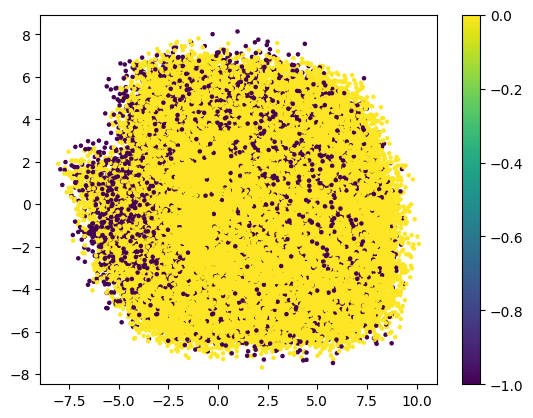

In [142]:
# Apply Truncated SVD to reduce the dimensionality for visualization
svd = TruncatedSVD(n_components=2)
mfccs_2d_svd = svd.fit_transform(mfccs_2d_scaled)

# Plot the clusters
plt.scatter(mfccs_2d_svd[:, 0], mfccs_2d_svd[:, 1], c=clusterer.labels_, cmap='viridis', s=5)
plt.colorbar()
plt.show()

# Query by Time

In [145]:
sample_fileIDs = file_info.query('FileID in [{}]'.format(','.join(str(x) for x in q['FileID'])))

In [146]:
sample_fileIDs

,FileID,TreatmentID,File name,File folder,Recording channel,Recording time,voice_start_sample_1,voice_end_sample_1,voice_start_sample_2,voice_end_sample_2,...,voice_start_sample_159,voice_end_sample_159,voice_start_sample_160,voice_end_sample_160,voice_start_sample_161,voice_end_sample_161,voice_start_sample_162,voice_end_sample_162,voice_start_sample_163,voice_end_sample_163
58196,58196,11,121002212651151905.WAV,files201,11,2012-10-02 21:26:51,37678.0,66019.0,105273.0,124646.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
59887,59887,11,121003075445185924.WAV,files201,11,2012-10-03 07:54:45,46237.0,72983.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61127,61127,9,121004012724018306.WAV,files201,4,2012-10-04 01:27:24,52095.0,84510.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61210,61210,9,121004021709034268.WAV,files201,3,2012-10-04 02:17:52,47793.0,98335.0,107838.0,123991.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61699,61699,9,121004094635378899.WAV,files201,3,2012-10-04 09:50:38,51675.0,66979.0,139695.0,175894.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146697,146697,15,121217230726142055.WAV,files210,12,2012-12-17 23:07:26,35549.0,71331.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
146698,146698,15,121217230811179056.WAV,files210,12,2012-12-17 23:08:11,44737.0,93087.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
146699,146699,15,121217230844152057.WAV,files210,12,2012-12-17 23:08:44,37908.0,90579.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
146701,146701,15,121217231303167058.WAV,files210,12,2012-12-17 23:13:03,41670.0,88579.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [147]:
# group rows by day and count the number of rows in each group
counts_by_day = sample_fileIDs.groupby(pd.Grouper(key='Recording time', freq='D')).size().reset_index(name='counts')


In [148]:
counts_by_day

,Recording time,counts
0,2012-10-02,1
1,2012-10-03,1
2,2012-10-04,19
3,2012-10-05,13
4,2012-10-06,19
...,...,...
72,2012-12-13,10
73,2012-12-14,24
74,2012-12-15,83
75,2012-12-16,1


In [167]:
fileID_by_emitter = q.set_index("Emitter").loc[111]["FileID"]

In [169]:
# group rows by day and count the number of rows in each group
counts_by_day = sample_fileIDs.loc[fileID_by_emitter].groupby(pd.Grouper(key='Recording time', freq='D')).size().reset_index(name='counts')

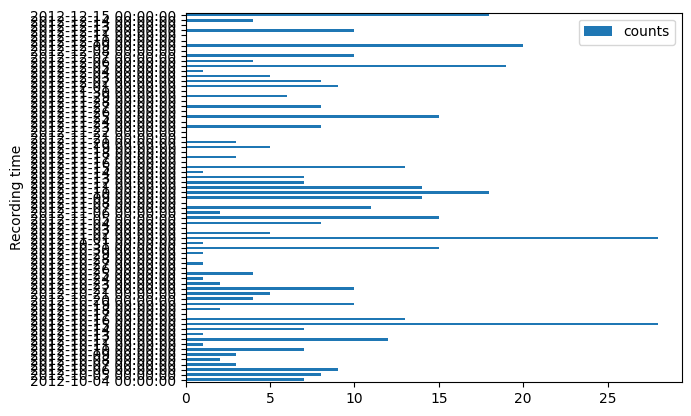

In [170]:
ax = counts_by_day.plot(
    kind='barh', 
    x='Recording time', 
    y='counts'
)


In [172]:
counts_by_day['Recording time']

0    2012-10-04
1    2012-10-05
2    2012-10-06
3    2012-10-07
4    2012-10-08
        ...    
68   2012-12-11
69   2012-12-12
70   2012-12-13
71   2012-12-14
72   2012-12-15
Name: Recording time, Length: 73, dtype: datetime64[ns]

In [34]:
df['FileID']

Emitter
210    135954
210    137328
210    137878
Name: FileID, dtype: int64

In [35]:
q.set_index('Emitter').loc[Emitter]

array([ 58196,  59887,  61127, ..., 146699, 146701, 146708])

Some things not clear:

Emitters produces more types of Contexts in 5 minutes:
- Emitter 111 : [ 3 11  4]
- Emitter 214 : [ 6 11 12  3]

In [55]:
# test if an Emitter "change topic" 
for Emitter in q.Emitter.unique():
    print(f'Emitter {Emitter}')
    df = q.set_index('Emitter').loc[Emitter]
    df.set_index('FileID')
    print(f"Contexts observed for this Emitter: {df['Context'].unique()} Number of vocalizations:{df.shape }")

    # collate each 5m
    groups = sample_files.loc[df['FileID']].groupby(pd.Grouper(key='Recording time', freq='300s'))
    for name, group in groups:
        contexts_in_session = q.set_index('FileID').loc[group['FileID']]['Context'].unique()
        if len(contexts_in_session) > 1:
            print(f"Contexts: { contexts_in_session }")

Emitter 207
Contexts observed for this Emitter: [6] Number of vocalizations:(74, 9)
Emitter 120
Contexts observed for this Emitter: [11  3 12 10  6] Number of vocalizations:(322, 9)
Contexts: [ 3 11]
Contexts: [ 3 11]
Contexts: [ 3 11]
Contexts: [11  3]
Contexts: [11  3]
Contexts: [11  3]
Emitter 111
Contexts observed for this Emitter: [11 12  3  2 10  5  4] Number of vocalizations:(456, 9)
Contexts: [11  3]
Contexts: [2 3]
Contexts: [ 3 11]
Contexts: [ 3 11]
Contexts: [11 10]
Contexts: [11  3]
Contexts: [ 3 11  4]
Contexts: [11 10]
Contexts: [ 3 11]
Emitter 215
Contexts observed for this Emitter: [6] Number of vocalizations:(63, 9)
Emitter 231
Contexts observed for this Emitter: [ 6 11 12  4 10] Number of vocalizations:(69, 9)
Emitter 214
Contexts observed for this Emitter: [ 6 11 12  3] Number of vocalizations:(21, 9)
Emitter 202
Contexts observed for this Emitter: [ 6 11 12  3 10  4] Number of vocalizations:(58, 9)
Emitter 216
Contexts observed for this Emitter: [ 6 11 12  3 10  4] 

In [46]:
q.set_index('FileID').loc[group['FileID']]['Context'].unique()

array([6])

In [37]:
# Group the dataframe by 'Record time'
groups = sample_files.loc[df['FileID']].groupby(pd.Grouper(key='Recording time', freq='300s'))

# Loop through the groups and form sequences of 'File name'
sequences = []
for name, group in groups:
    if len(group) > 0:
        sequence = list(group['File name'])
        sequences.append(sequence)

In [341]:
for sequence in sequences:
    try:
        symbolic_sequences.loc[sequence]
    except:
        pass
        
        

In [343]:
sequences;

In [344]:
sample_fileIDs.set_index('File name').loc[symbolic_sequences.loc[sequences[7]].index]

,FileID,TreatmentID,File folder,Recording channel,Recording time,voice_start_sample_1,voice_end_sample_1,voice_start_sample_2,voice_end_sample_2,voice_start_sample_3,...,voice_start_sample_159,voice_end_sample_159,voice_start_sample_160,voice_end_sample_160,voice_start_sample_161,voice_end_sample_161,voice_start_sample_162,voice_end_sample_162,voice_start_sample_163,voice_end_sample_163
121005193853982507.WAV,63347,9,files201,4,2012-10-05 19:47:52,189920.0,203962.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
121005193916033511.WAV,63348,9,files201,4,2012-10-05 19:48:15,50159.0,96966.0,107774.0,120740.0,120780.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
121005193917444512.WAV,63349,9,files201,4,2012-10-05 19:48:16,50794.0,66291.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [345]:
symbolic_sequences.loc[sequences[7]]

,Sequence,Duration,Folder
121005193853982507.WAV,[143],[14042],files201
121005193916033511.WAV,"[129, 141, 168]","[46807, 12966, 6404]",files201
121005193917444512.WAV,[137],[15497],files201


In [315]:
for ix in symbolic_sequences.loc[sequences[7]].index:
    sr, y, start_times, end_times = get_wav_info(ix)
    display(Audio(data = y, rate = 88200))

250000 394064


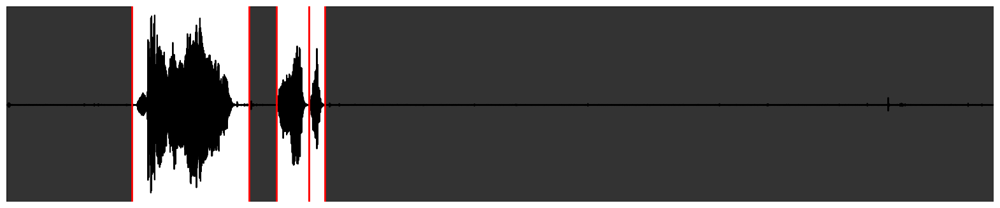

In [316]:
# test
#wav_loc = DSLOC/'zip_contents'/ 'files201' / '121004212010778472.WAV'
#wav_info = file_info[file_info['File name'] == '121004212010778472.WAV']


wav_loc = DSLOC/'zip_contents'/ 'files201' / '121005193916033511.WAV'
wav_info = file_info[file_info['File name'] == '121005193916033511.WAV']

rate, data = load_wav(wav_loc)
print(rate, len(data))

start_times = wav_info.loc[:, wav_info.columns.str.startswith('voice_start_')].dropna(axis=1).values[0]
end_times = wav_info.loc[:, wav_info.columns.str.startswith('voice_end_')].dropna(axis=1).values[0]

assert(len(start_times) == len(end_times))


fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(20,4))
plt.plot(data, color='black')
ax.set_xlim((0, len(data)))
ax.axis('off')

# not selected silence
for st, et in zip(end_times[:-1], start_times[1:]):
    ax.axvspan(st, et, alpha=0.8, color='black')
    
ax.axvspan(0, start_times[0], alpha=0.8, color='black')
ax.axvspan(end_times[-1], len(data), alpha=0.8, color='black')

# selected
for st, et in zip(start_times, end_times):
    ax.axvline(x=st, color = 'red', lw=2)
    ax.axvline(x=et, color='red', lw=2)
plt.show()

Audio(data = data, rate = 88200)

In [317]:
symbolic_sequences.loc[sequence]

KeyError: "None of [Index(['121215221048073824.WAV'], dtype='object')] are in the [index]"

In [197]:
sample_fileIDs.loc[fileID_by_emitter].groupby(pd.Grouper(key='Recording time', freq='D')).size().reset_index(name='counts')

,Recording time,counts
0,2012-10-04,7
1,2012-10-05,8
2,2012-10-06,9
3,2012-10-07,3
4,2012-10-08,2
...,...,...
68,2012-12-11,0
69,2012-12-12,10
70,2012-12-13,0
71,2012-12-14,4


In [204]:
symbolic_sequences

,Sequence,Duration,Folder
121002212651151905.WAV,"[135, -1, -1]","[28341, 19373, 28746]",files201
121004173829175487.WAV,"[135, 136]","[28246, 27746]",files201
121008193330171556.WAV,"[135, 60, 63]","[26246, 37246, 28246]",files202
121013043909583127.WAV,"[135, -1, 145, 147]","[6987, 10746, 9402, 28246]",files202
121014185946980156.WAV,"[135, -1, -1, -1, -1, 129, 62, 52, 77, 10]","[10569, 50161, 13841, 36379, 27525, 16854, 278...",files202
...,...,...,...
121207213417480542.WAV,[116],[46246],files209
121209175923901937.WAV,[116],[18676],files209
121209185628318962.WAV,[95],[23081],files209
121105224225528055.WAV,[148],[32668],files204
